<img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTaJWG7PzF3toxaRMB1-JicpqMgJuEXATd0fg&" style="width: 150px;margin-top:30px;" align ="center">

<div style= "font-size: 40px;font-weight:bold; font-family: 'Avenir Next LT Pro', sans-serif;"><center>To grant or not to grant:</center></div> <br>
<div style= "font-size: 40px;font-weight:bold; font-family: 'Avenir Next LT Pro', sans-serif;"><center>Deciding on compensation benefits</center></div>

<div style= "font-size: 27px;font-weight:bold;line-height: 1.1; margin-top:40px; font-family: 'Avenir Next LT Pro', sans-serif;"><center>Machine Learning 2024/2025</center></div> <br>

   <div style= "font-size: 20px;font-weight:bold; font-family: 'Avenir Next LT Pro', sans-serif;"><center> Group 50:</center></div>
   <div><center> Eldar Medvedev | r20181162 </center></div>
   <div><center> Jéssica Cristas | 20240488 </center></div>
   <div><center> Joshua Wehr | 20240501 </center></div>
   <div><center> Guilherme Godinho | 20211552 </center></div>
   <div><center> Umeima Adam | 20240543 </center></div>

<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <style>
        body {
            font-family: Arial, sans-serif;
            background-color: #f4f4f4;
            color: #333;
            margin: 0;
            padding: 20px;
            line-height: 1.6;
        }
        ol {
            counter-reset: section 2; /* Start counting from 3 */            
            list-style: none;
            padding-left: 0;
        }
        /* First-level list */
        ol > li {
            counter-increment: section;
            margin-bottom: 10px;
            padding-left: 0;
        }
        ol > li::before {
            content: counters(section, ".") " ";
            font-weight: bold;
        }
        /* Second-level list */
        ol ol {
            counter-reset: subsection;
            padding-left: 20px;
            margin-top: 5px;
        }
        ol ol > li {
            counter-increment: subsection;
            margin-bottom: 5px;
            padding-left: 10px;
        }
        ol ol > li::before {
            content: counters(section, ".") "." counter(subsection) " ";
            font-weight: bold;
        }
        a {
            text-decoration: none;
            color: #007BFF;
            font-weight: bold;
        }
        a:hover {
            color: #0056b3;
        }
        footer {
            margin-top: 50px;
        }
    </style>
</head>
<body>

<h2><b>Index</b></h2>
<ol>
    <li><a href="#3">Data Preprocessing Functions</a> </li>
        <ol>
        <li><a href="#3.1">Functions | Initial steps</a> </li> 
        <li><a href="#3.2">Functions | Support </a> </li> 
        <li><a href="#3.3">Functions | KNN</a> </li>
        <li><a href="#3.4">Functions | Dates</a> </li>
        <li><a href="#3.5">Functions | Additional Preprocessing</a> </li>
        <li><a href="#3.6">Functions | Feature Selection</a> </li>
        <li><a href="#3.7">Functions | Modelling</a> </li>
        </ol>
    <li><a href="#4">Modelling</a> </li>
    <li><a href="#5">Evaluation</a> </li>
</ol>

<footer></footer>

</body>
</html>

## **Note:**

This notebook is a part of our Open Ended Section and here we predict Agreement Reached for the test dataset. This also served as a way to discover that this variable is valuable for predicting our original target, Claim Injury Type.

# <a class='anchor' id='3'></a>

> # **3. Data Preprocessing Application** 

## Importing Data and Libraries

In [394]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
#Suppress LightGBM warnings
warnings.filterwarnings("ignore", category=UserWarning, module='lightgbm')
pd.set_option('display.max_columns', None)

In [395]:
train = pd.read_csv('train_data.csv')
test = pd.read_csv('test_data.csv')

# <a class='anchor' id='3.1'></a>

## **Functions: Initial steps**

In [396]:
def init_():
    """    
    The purpose of init_ function is to extract id (Claim Identifier) from the train and test datasets 
    and target (Claim Injury Type) from train.
    
    """
    # Save train and test id
    train_id = pd.DataFrame(train['Claim Identifier'])
    test_id = pd.DataFrame(test['Claim Identifier'])
    
    # Save target
    target = pd.DataFrame(train['Claim Injury Type'])

    return train_id, test_id, target

In [397]:
def incoherences_between(data_train, data_test, target):
    """ 
    The function aims to make the column structures of the train and test datasets consistent, 
    except for the target column, by dropping columns that do not exist in both datasets.
    
    Parameters:
    - data_train: pd.DataFrame - DataFrame containing the training data.
    - data_test: pd.DataFrame - DataFrame containing the test data.
    - target: pd.DataFrame -
    
    Returns:
    - data_train, data_test - DataFrames without different columns
    
    """
    
    # Columns that exist in the test dataset but are not in the train dataset.
    test_train_inc = [col for col in list(data_test.columns) if col not in list(data_train.columns)]
    
    # Columns that exist in the train dataset but are not in the test dataset.
    train_test_inc = [col for col in list(data_train.columns) if col not in list(data_test.columns)]
    
    # Drop columns that exist in just one dataset (except target)
    train_test_inc.remove(target.columns[0])
    train_test_inc.remove('Agreement Reached')
    
    data_train = data_train.drop(columns=train_test_inc)
    data_test = data_test.drop(columns=test_train_inc)
    
    return data_train, data_test

In [398]:
def incoherences_within(data, data_id):
    """    
    Cleans a dataset by addressing three types of inconsistencies
    1. Removing rows with too many missing values.
    2. Removing columns with too many missing values.
    3. Removing duplicate rows based on an identifier column.
    
    Parameters:
    - data: pd.DataFrame - DataFrame on which the function is applied
    - data_id: pd.DataFrame - DataFrame with ID 
    
    Returns:
    - data: pd.DataFrame - DataFrame cleaned
    
    """
    # Filter rows with more than 60% missing values
    data = data.loc[data.isna().mean(axis=1) < 0.6]

    # Filter columns with more than 90% missing values
    data = data.loc[:, data.isna().mean(axis=0) < 0.9]

    # Remove duplicate rows based on the `data_id` column
    data = data.drop_duplicates(subset=data_id.columns[0], keep='first')

    return data

In [399]:
def transform_data(data, data_id):
    """
    Processes and transforms the columns of a DataFrame based on their data type and unique value characteristics. 
    Its goal is to prepare the data for analysis and modeling by applying transformations like 
    date conversion, binary mapping, or handling rare categories. 
    Features that could be tranformed to a boolean but have more than 2 unique values are handled with ZeroR 
    (Attorney/Representative, Gender, etc...).
    
    Parameters:
    - data: pd.DataFrame - DataFrame on which the function is applied
    - data_id: pd.DataFrame - DataFrame with ID 
    
    Returns:
    - data: pd.DataFrame - DataFrame with columns transformed
    """

    for col in data.columns:
        
        # Check if column is ID
        if col == data_id.columns[0]:
            print(f"Column '{col}' is ID, no transformation needed")
            
        # Check if the column is of type 'object'
        elif data[col].dtype == 'object':
            
            # If column is of type 'object' attempt to convert to datetime format
            try:
                data[col] = pd.to_datetime(data[col], errors='raise')
                print(f"Column '{col}' is a date, converted to datetime format.")
            except Exception:
                
                # If an error occurs, try transforming the column
                unique_values = data[col].dropna().unique()
                
                if set(unique_values) == {'Y', 'N'}:  # Check if it only has 'Y' and 'N'
                    data[col] = data[col].map({'Y': 1, 'N': 0})
                    print(f"Column '{col}': Transformed Y to 1, N to 0")
                    
                # If there are exactly 2 unique values that are not 'Y' and 'N'
                elif len(unique_values) == 2 and set(unique_values) != {'Y', 'N'}:
                    most_frequent_value = data[col].mode()[0]
                    least_frequent_value = data[col].value_counts().idxmin()
                    
                    # Assign 1 to most frequent value, 0 to another 
                    data[col] = data[col].map({most_frequent_value: 1, least_frequent_value: 0})
                    print(f"Column '{col}': Transformed '{most_frequent_value}' to 1, '{least_frequent_value}' to 0")
                    
                # If there are more than 2 unique values but less or equal to 4
                # If % of some unique values is low, we replace it by ZeroR value and transform column to boolean.
                elif 2 < len(unique_values) <= 4:
                    most_frequent_value = data[col].mode()[0]

                    # Get the normalized value counts and identify values with counts lower than 0.001
                    normalized_counts = data[col].value_counts(normalize=True)

                    # Filter values with normalized counts lower than 0.001
                    values_to_transform = normalized_counts[normalized_counts < 0.001].index

                    # Replace these values with the most frequent value (ZeroR)
                    data[col] = data[col].replace(values_to_transform, most_frequent_value)
                    
                    # Replace Unknown with the most frequent value (ZeroR)
                    data[col] = data[col].replace('U', most_frequent_value)
                    least_frequent_value = data[col].value_counts().idxmin()
                    
                    # Re-check unique values and attempt transformation again
                    unique_values = data[col].dropna().unique()
                    if len(unique_values) == 2 and set(unique_values) != {'Y', 'N'}:
                        data[col] = data[col].map({most_frequent_value: 1, least_frequent_value: 0})
                        print(f"Column '{col}': Transformed '{most_frequent_value}' to 1, {least_frequent_value} to 0")

                    elif set(unique_values) == {'Y', 'N'}:
                        data[col] = data[col].map({'Y': 1, 'N': 0})
                        print(f"Column '{col}': Transformed Y to 1, N to 0")
                        
                    else:
                        print(f"Column '{col}' with <=4 unique values, no further transformation applied.")
                        
                # If column cannot be handled with this function, we skip it       
                else:
                    print(f"Column '{col}' cannot be converted. Skipping...")
                    
        # If column is numerical, we skip it
        elif data[col].dtype in ['float64', 'int64']:
            print(f"Column '{col}' is numerical, no transformation needed")
    
    return data


# <a class='anchor' id='3.2'></a>
## **Functions: Support**

In [400]:
import operator

def redflags(data, cols, conditions, bounds):
    """
    Adds Red Flag columns for either:
    - Multiple columns (one condition per column) or
    - A single column (multiple conditions combined).

    Parameters:
    - data: pd.DataFrame - DataFrame where the Red Flags will be added.
    - cols: str or list -  Column(s) to apply conditions on.
    - conditions: list -  List of conditions (e.g., ['>', '<']).
    - bounds: list - List of bounds corresponding to each condition.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with the Red Flag columns.
    """
    
    # Map condition strings to corresponding operator functions
    operations = {
        '<': operator.lt,
        '>': operator.gt,
        '==': operator.eq,
        '<=': operator.le,
        '>=': operator.ge,
        '!=': operator.ne,
    }

    # Case 1: Single Column (Apply multiple conditions to one column)
    if isinstance(cols, str):
        # Ensure that the number of conditions matches the number of bounds
        if len(conditions) != len(bounds):
            raise ValueError("The number of conditions must match the number of bounds for a single column.")
        
        # Create a new column for Red Flags, initialize it to 0 (no flags initially)
        flag_col_name = f'Red_Flag_{cols}'
        data[flag_col_name] = 0  # Start with all zeros
        
        # Apply each condition and update the Red Flag column
        for condition, bound in zip(conditions, bounds):
            op_func = operations.get(condition) # Get the corresponding operator function
            if op_func is None:
                raise ValueError(f"Invalid condition: {condition}")
            
           # Update Red Flag column using logical OR to combine multiple conditions
            data[flag_col_name] |= op_func(data[cols], bound).astype(int)

    # Case 2: Multiple Columns (Each column gets its own condition and bound)
    elif isinstance(cols, list):
        # Ensure the lengths of `cols`, `conditions`, and `bounds` match
        if len(cols) != len(conditions) or len(cols) != len(bounds):
            raise ValueError("For multiple columns, `cols`, `conditions`, and `bounds` must have the same length.")
        
        # Iterate over each column and apply its condition and bound
        for col, condition, bound in zip(cols, conditions, bounds):
            op_func = operations.get(condition)
            if op_func is None:
                raise ValueError(f"Invalid condition: {condition}")
            
            # Create a separate Red Flag column for each column
            data[f'Red_Flag_{col}'] = op_func(data[col], bound).astype(int)
            
    # Case 3: Invalid `cols` type
    else:
        raise ValueError("`cols` must be a string (for a single column) or a list (for multiple columns).")
    
    return data

In [401]:
def fill_with_0(data,cols):
    """
    Fills missing values (NaN) with 0 for specified columns in a DataFrame.

    Parameters:
    - data: pd.DataFrame - The input DataFrame where missing values will be filled.
    - cols: list - A list of column names to process.

    Returns:
    - data: pd.DataFrame - The updated DataFrame with missing values replaced by 0 in the specified columns.
    """

    for col in cols:
        data[col] = data[col].fillna(0)
        
    return data

In [402]:
def missing_cols(data, cols):
    """
    Creates new binary columns to indicate missing values in the specified columns.

    Parameters:
    - data: pd.DataFrame - Input DataFrame where missing value indicators will be added.
    - cols: list - List of column names to check for missing values.

    Returns:
    - data: pd.DataFrame -  Updated DataFrame with additional 'Missing_<col>' binary columns.
    """
    
    for col in cols:
        
        # Create a new column 'Missing_<col>' that is 1 if the value is missing, 0 otherwise
        data['Missing_'+ col] = data[col].isnull().astype(int)

    return data

In [403]:
def outlier_identifier(data , col):
    """
    Identifies outlier thresholds for a given column using the Interquartile Range (IQR).
    Also calculates a separate upper limit for positive values (> 0).

    Parameters:
    - data: pd.DataFrame - The input DataFrame.
    - col: str - The name of the column for which outlier thresholds will be calculated.

    Returns:
    - tuple: A tuple containing:
            - lower_limit: The lower threshold for outliers.
            - upper_limit: The upper threshold for outliers.
            - upper_limit_bigger_0: The upper threshold for outliers among positive values (> 0),
              or None if there are no positive values.
    """
    
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    # Calculate the upper limit for positive values, if any exist
    data_positive = data[data[col] > 0]
    if not data_positive.empty:  # Check if there are positive values
        Q3_positive = data_positive[col].quantile(0.75)
        IQR_positive = Q3_positive - data_positive[col].quantile(0.25)
        upper_limit_bigger_0 = Q3_positive + 1.5 * IQR_positive
    else:
        upper_limit_bigger_0 = None  # Set to None if no positive values exist

    return lower_limit, upper_limit, upper_limit_bigger_0



In [404]:
def drop_col(data, cols):
    """
    Drops specified columns from a DataFrame, ignoring errors if a column does not exist.

    Parameters:
    - data: pd.DataFrame - The input DataFrame.
    - cols: list - List of column names to drop.

    Returns:
    data: pd.DataFrame - Updated DataFrame with specified columns removed.
    """

    for col in cols:
        try:
            data = data.drop(columns=[col])
        except:
                pass
    
    return data

In [405]:
def change_types(data):
    """
    Changes the data types of specified columns in a DataFrame to ensure 
    consistency. (Used for debugging)

    Parameters:
    - data: pd.DataFrame - The input DataFrame with columns to convert.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with specified columns converted to target data types.
    """

    data['Alternative Dispute Resolution'] = data['Alternative Dispute Resolution'].astype('int32', errors='ignore')
    data['Is Weekend'] = data['Is Weekend'].astype('int32', errors='ignore')
    data['Age at Injury'] = data['Age at Injury'].astype('int64', errors='ignore')
    data['Attorney/Representative'] = data['Attorney/Representative'].astype('int32', errors='ignore')
    data['COVID-19 Indicator'] = data['COVID-19 Indicator'].astype('int32', errors='ignore')
    data['IME-4 Count'] = data['IME-4 Count'].astype('int64', errors='ignore')
    
    return data

In [406]:
def join_bool(data, cols, name):
    """
    Creates a new column in the data DataFrame that aggregates the values from a list of specified columns (cols). 
    This will be used for dealing with one-hot encoded columns.
    
    Parameters:
    - data: pd.DataFrame - DataFrame on which the function is applied
    - cols: list - Target columns for joining
    - name: str - Name of a new column
    
    Returns:
    - data: pd.DataFrame - DataFrame with joined column 
    """
    # Initialize the new column with 0s
    data[name] = 0
    
    for col in cols:
        if col in data.columns:
            # Add the values of the existing column to the new column
            data[name] += data[col]
    
    return data

    

In [407]:
def remove_first_and_last(string):
    """
    Removes the first and last words from a given string.
    
    Parameters:
    - string: str - The input string.
        
    Returns:
    - str: The string with the first and last words removed. If the input has
           two or fewer words, returns an empty string.
    """
    
    words = string.split()  # Split the string into a list of words
    if len(words) <= 2:     # If there are 2 or fewer words, return an empty string
        return ""
    
    return " ".join(words[1:-1])

In [408]:
def encode_columns(cols, data_train, data_test, test, method="frequency"):
    """
    Encodes specified columns in training and testing datasets using either 
    frequency encoding or one-hot encoding.

    Parameters:
    - cols: list - List of column names to encode.
    - data_train: pd.DataFrame - Training dataset.
    - data_test: pd.DataFrame - Testing dataset.
    - test: pd.DataFrame - Testing dataset for kaggle submission.
    - method: str - Encoding method, either "frequency" or "onehot" (Default = frequency).

    Returns:
    - data_train, data_test, test - Updated training and testing DataFrames with encoded columns.

    Raises:
    - ValueError: If the `method` is not "frequency" or "onehot".
    """
    
    if method not in ["frequency", "onehot"]:
        raise ValueError("The method must be 'frequency' or 'onehot'.")

    if method == "frequency":
        for col in cols:
            # Create frequency encoding
            frequency_encoding = data_train[col].value_counts().to_dict()
            data_train[col + " Frequency"] = data_train[col].map(frequency_encoding)

            data_test[col + " Frequency"] = data_test[col].map(frequency_encoding)
            # In case if there are values that exist in test but does not exist in train
            data_test[col + " Frequency"] = data_test[col + " Frequency"].fillna(0)

            test[col + " Frequency"] = test[col].map(frequency_encoding)
            # In case if there are values that exist in test but does not exist in train
            test[col + " Frequency"] = test[col + " Frequency"].fillna(0)
    
    
    elif method == "onehot":
        for col in cols:
            prefix = col.split()[0]

            # Apply one-hot encoding to both data and test
            one_hot_encoded_train = pd.get_dummies(data_train[col], prefix=prefix, drop_first=False)
            one_hot_encoded_test = pd.get_dummies(data_test[col], prefix=prefix, drop_first=False)

            one_hot_encoded_test_kaggle = pd.get_dummies(test[col], prefix=prefix, drop_first=False)

            # Concatenate the one-hot encoded columns back to the original DataFrame
            data_train = pd.concat([data_train, one_hot_encoded_train], axis=1)
            data_test = pd.concat([data_test, one_hot_encoded_test], axis=1)

            test = pd.concat([test, one_hot_encoded_test_kaggle], axis=1)

    return data_train, data_test, test


In [409]:
def split_data(X, y, test_size=0.25, random_state=42):
    """
    Splits the dataset into training and test sets.

    Parameters:
    - X (pd.DataFrame or np.array): Features dataset.
    - y (pd.Series or np.array): Target labels.
    - test_size (float): Proportion of the dataset to include in the test split.
    - random_state (int): Random seed for reproducibility.
    - stratify (bool): Whether to stratify the split based on `y`.

    Returns:
    - X_train, X_test, y_train, y_test: Split datasets.
    """

    X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=test_size, random_state=random_state, stratify=y
        )


    print(f"Data split complete: Training size = {len(X_train)}, Test size = {len(X_test)}")
    return X_train, X_test, y_train, y_test


# <a class='anchor' id='3.3'></a>
## **Functions: KNN**

In [410]:
def get_corr(data, target_col, n_corr=5):
    """
    Identifies the columns in a dataset (data) that have the strongest correlations
    with a specified target column (target_col). It selects a specified number (n_corr) of the most correlated columns,
    prioritizing boolean-like columns, while excluding columns with missing values and IME-4 Count excluded columns.
    IME-4 Count is excluded due to empirical research. Missing IME-4 Count is more prefered and they have high correlation.
    
    Parameters:
    - data: pd.DataFrame - DataFrame on which the function is applied
    - target_col: str - Target column name
    - n_corr: int - Number of columns with highest correlation (default = 5)
    
    Returns:
    - selected_columns: list - List of highest correlation columns
    
    """
    
    correlations = data.corr()[target_col].abs().sort_values(ascending=False)
    
    # Exclude the target column itself and the IME-4 Count
    top_columns = correlations.index[1:] # Start from 1 to exclude the target column
    exclude_cols = [col for col in data.columns if data[col].isnull().any()] + ['IME-4 Count']
    top_columns = [col for col in top_columns if col not in exclude_cols]
    
    # Identify boolean-like columns (int with only values 0 and 1)
    boolean_columns = [col for col in top_columns if data[col].nunique() == 2 and sorted(data[col].unique()) == [0, 1]]
    non_boolean_columns = [col for col in top_columns if col not in boolean_columns]
    
    # Take up to 2 boolean columns
    selected_boolean_columns = boolean_columns[:2]
    
    # Take the remaining columns from non-boolean ones to complete n_corr
    remaining_count = n_corr - len(selected_boolean_columns)
    selected_non_boolean_columns = non_boolean_columns[:remaining_count]
    
    # Combine the selections
    selected_columns = selected_boolean_columns + selected_non_boolean_columns
    
    print(f"Our '{target_col}' has the highest correlation with {selected_columns}.")
    
    return selected_columns

In [411]:
def knn_features(data):
    """
    Combines a lists of features from get_corr function for every column with missing values
    in order to give to knn function a list of unique features without repetitions.
    
    Parameters:
    - data: pd.DataFrame - DataFrame on which the function is applied.
    
    Returns:
    - features_for_knn: list - List of features with highest correlations without repetitions 
    
    """
    columns_with_nan = [col for col in data.columns if data[col].isnull().any()]

    features_for_knn = []
    
    for col in columns_with_nan:
        features_for_knn.append(get_corr(data, col))

    features_for_knn = list(set(item for sublist in features_for_knn for item in sublist))

    return features_for_knn

In [412]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler


def knn(data_train, data_test, test, target_cols, features, n_neighbors=5):
    """
    Imputes missing values using KNN, applying Min-Max Scaling beforehand and reversing the scaling afterward, 
    ensuring no data leakage in the test set.

    Parameters:
    - data_train: pd.DataFrame - DataFrame containing the training data.
    - data_test: pd.DataFrame - DataFrame containing the test data.
    - test: pd.DataFrame - DataFrame containing the test data for kaggle submission.
    - target_cols: list - Target columns for imputation.
    - features: list - Feature columns to use for KNN.
    - n_neighbors: int - Number of neighbors for KNN. Default is 5.

    Returns:
    - data_train, data_test, test updated dataframes.
    """


    # Identify indexes of missing and non-missing values in train dataset
    missing_indices_train = data_train.loc[data_train[target_cols].isnull().any(axis=1)].index
    not_missing_indices_train = data_train.loc[data_train[target_cols].notnull().all(axis=1)].index

    # Sample 15% observations without missing values
    sampled_indices_train = np.random.choice(
        not_missing_indices_train, 
        size=max(1, int(0.15 * len(not_missing_indices_train))), 
        replace=False
    )

    # Combine our sample with missing rows
    combined_indices_train = np.concatenate([missing_indices_train, sampled_indices_train])

    # Train subset for knn. 
    subset_train = data_train.loc[combined_indices_train, target_cols + features]

    # Here we fit_transform MinMaxScaler for train
    scaler = MinMaxScaler()
    scaled_subset_train = pd.DataFrame(
        scaler.fit_transform(subset_train),
        columns=target_cols + features,
        index=combined_indices_train
    )

    # Prepare KNNImputer and fit just for train 
    knn_imputer = KNNImputer(n_neighbors=n_neighbors)
    knn_imputer.fit(scaled_subset_train)

    # Transform for train
    imputed_train = knn_imputer.transform(scaled_subset_train)

    # Unscaling train data
    imputed_data_unscaled_train = pd.DataFrame(
        scaler.inverse_transform(imputed_train),
        columns=target_cols + features,
        index=combined_indices_train
    )

    # Replace values imputed in data_train 
    data_train.loc[missing_indices_train, target_cols] = imputed_data_unscaled_train.loc[missing_indices_train, target_cols]

    # Test subset for knn
    subset_test = data_test[target_cols + features]
    subset_test_kaggle = test[target_cols + features]

    # Just transform MinMaxScaler for test
    scaled_test = pd.DataFrame(
        scaler.transform(subset_test),
        columns=target_cols + features,
        index=data_test.index
    )

    scaled_test_kaggle = pd.DataFrame(
        scaler.transform(subset_test_kaggle),
        columns=target_cols + features,
        index=test.index
    )


    # Just transform for test without fit
    imputed_test = knn_imputer.transform(scaled_test)

    imputed_test_kaggle = knn_imputer.transform(scaled_test_kaggle)

    # Unscaling test data
    imputed_data_unscaled_test = pd.DataFrame(
        scaler.inverse_transform(imputed_test),
        columns=target_cols + features,
        index=data_test.index
    )

    imputed_data_unscaled_test_kaggle = pd.DataFrame(
        scaler.inverse_transform(imputed_test_kaggle),
        columns=target_cols + features,
        index=test.index
    )

    # Replace values imputed in data_est
    data_test[target_cols] = imputed_data_unscaled_test[target_cols]

    test[target_cols] = imputed_data_unscaled_test_kaggle[target_cols]

    # Final ajustments (rounding Age and Industry Code Avg_Salary)
    data_train['Age at Injury'] = data_train['Age at Injury'].round()
    data_train['Industry Code Avg_Salary'] = data_train['Industry Code Avg_Salary'].round()

    data_test['Age at Injury'] = data_test['Age at Injury'].round()
    data_test['Industry Code Avg_Salary'] = data_test['Industry Code Avg_Salary'].round()

    test['Age at Injury'] = test['Age at Injury'].round()
    test['Industry Code Avg_Salary'] = test['Industry Code Avg_Salary'].round()

    return data_train, data_test, test


# <a class='anchor' id='3.4'></a>
## **Functions: Dates**

In [413]:
def greenflag_dates(data):
    """
    Adds a 'Greenflag Dates' column to indicate whether the dates are in "best" order.

    Parameters:
    - data: pd.DataFrame - Input DataFrame containing the relevant date columns.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with a new binary 'Greenflag Dates' column.
    """

    data['Greenflag Dates'] = (
    (data['Accident Date'] <= data['C-2 Date']) &
    (data['C-2 Date'] <= data['Assembly Date']) &
    (data['Assembly Date'] <= data['C-3 Date'])&
    (data['C-3 Date'] <= data['First Hearing Date'])
    ).astype(int) # Convert boolean values to 1 (True) or 0 (False)

    return data

In [414]:
from itertools import permutations

def create_date_sequence_columns(data, date_columns):
    """
    Creates new columns to validate all permutations of a sequence of date columns.

    Parameters:
    - data: pd.DataFrame - The input DataFrame containing date columns.
    - date_columns: list - List of column names representing date columns.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with new boolean columns for each date sequence.
    """   

    # Generate all permutations of the date columns
    sequences = list(permutations(date_columns))
    
    # Iterate over each permutation of the date columns
    for seq in sequences:
        col_name = ' - '.join(seq)  # Name for the new column
        data[col_name] = (data[seq[0]] <= data[seq[1]]) & (data[seq[1]] <= data[seq[2]])  # Check the correct order for the sequence
    
    return data

In [415]:
def dates_null_comparison(data, cols):
    """
    Creates binary indicator columns to check combinations of missing and non-missing values
    between two specified columns.

    Parameters:
    - data: pd.DataFrame - The input DataFrame where the checks will be applied.
    - cols: list - A list containing exactly two column names [col1, col2].

    Returns:
    - data: pd.DataFrame - Updated DataFrame with four new binary columns.
    """
    
    # Extract the two column names for readability
    col1 = cols[0]
    col2 = cols[1]
    
    # 1. Create a column indicating when col1 is NOT missing and col2 IS missing
    data[f'{col1}_Not_Missing_{col2}_Missing'] = (~data[col1].isna()) & (data[col2].isna())
    
    # 2. Create a column indicating when col1 IS missing and col2 is NOT missing
    data[f'{col2}_Not_Missing_{col1}_Missing'] = (data[col1].isna()) & (~data[col2].isna())
    
    # 3. Create a column indicating when both col1 and col2 are NOT missing
    data[f'{col1}_Not_Missing_{col2}_Not_Missing'] = (~data[col1].isna()) & (~data[col2].isna())
    
    # 4. Create a column indicating when both col1 and col2 ARE missing
    data[f'{col1}_Missing_{col2}_Missing'] = (data[col1].isna()) & (data[col2].isna())
    
    return data


In [416]:
def fill_nan_with_assembly(data, cols):
    """
    Fills NaN (missing) values in specified columns with values from the 'Assembly Date' column.

    Parameters:
    - data: pd.DataFrame - The input DataFrame where missing values will be filled.
    - cols: list - List of column names where NaN values will be replaced.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with NaN values replaced in the specified columns.
    """
    
    for col in cols:
        # Replace NaN values in the current column with values from 'Assembly Date'
        data[col] = data[col].fillna(data['Assembly Date'])
        
    return data

In [417]:
def creating_gaps(data, column_pairs): 
    """
    Creates new columns to calculate the difference in days between pairs of date columns.

    Parameters:
    - data: pd.DataFrame - The input DataFrame containing date columns.
    - column_pairs: list of tuples - List of column pairs (col1, col2) where gaps will be calculated.
                                     Each tuple should contain two column names.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with new columns representing day differences between the column pairs.
    """    
    
    for col1, col2 in column_pairs:
        # Create a new column representing the difference in days between col1 and col2
        data[f'{col2}_to_{col1} Days'] = (data[col1] - data[col2]).dt.days
        
    return data

In [418]:
def Follow_The_C2_Rules(data):
    """
    Creates a binary column to indicate whether the gap between 'Accident Date' and 'C-2 Date'
    follows the WCIO rule: C-2 document should be sent in 10 days.

    Parameters:
    - data: pd.DataFrame - The input DataFrame, which must include a column 'Accident Date_to_C-2 Date Days' with day differences.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with a binary column indicating rule compliance.
    """
    
    data['Accident Date_to_C-2 Date Days'].apply(lambda x: 1 if ((x <= 10) & (x >= 0)) else 0)

    return data

In [419]:
def Follow_The_C3_Rules(data):
    """
    Creates a binary column to indicate whether the gap between 'Accident Date' and 'C-3 Date'
    follows the WCIO rule: C-3 document should be sent in 2 years.

    Parameters:
    - data: pd.DataFrame - The input DataFrame, which must include a column 'Accident Date_to_C-3 Date Days' with day differences.
                           
    Returns:
    - data: pd.DataFrame - Updated DataFrame with a binary column indicating rule compliance.
    """
    
    data['Follow_The_C3_Rules'] = data['Accident Date_to_C-3 Date Days'].apply(lambda x: 1 if ((x <= 730) & (x >= 0)) else 0)
    
    return data

In [420]:
def extract_info_from_accident_date(data):
    """
    Extracts and processes date-related features from the 'Accident Date' column in the DataFrame.

    Parameters:
    - data: pd.DataFrame - Input DataFrame containing the 'Accident Date' column as a datetime object.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with additional date-related features:
                         - 'Year': The year extracted from 'Accident Date'.
                         - 'Season': Categorical season (Winter, Spring, Summer, Autumn) based on the month.
                         - 'Is Weekend': Binary flag indicating if the date falls on a weekend.
    """
    
    data['Year'] = data['Accident Date'].dt.year
    data['Month'] = data['Accident Date'].dt.month

    # Check for weekends (Saturday=5, Sunday=6)
    data['Is Weekend'] = data['Accident Date'].dt.dayofweek >= 5

    data.loc[data['Month'].isin([ 1, 2, 12]), 'Month'] = 1 # Winter
    data.loc[data['Month'].isin([3, 4, 5]), 'Month'] = 2 # Spring
    data.loc[data['Month'].isin([6, 7, 8]), 'Month'] = 3 # Summer
    data.loc[data['Month'].isin([9, 10, 11]), 'Month'] = 4 # Autumn

    data = data.rename(columns={'Month': 'Season'})

    return data

In [421]:
def age_incoherences(data_train, data_test, test):
    """
    Fixes inconsistencies in the 'Age at Injury' column based on the 'Birth Year' and 'Year' columns.
    Also handles outliers and ensures valid age values in both training and testing datasets.

    Parameters:
    - data_train: pd.DataFrame - The training DataFrame containing 'Age at Injury', 'Birth Year', and 'Year' columns.
    - data_test: pd.DataFrame - The testing DataFrame containing the same columns as `data_train`.
    - test: pd.DataFrame - The testing DataFrame containing the same columns as `data_train` for kaggle submission.

    Returns:
    - data_train, data_test, test - Updated Dataframes
    """

    data_train.loc[(data_train['Birth Year'] == 0) & (data_train['Age at Injury'] == 0), 'Age at Injury'] = np.nan
    data_test.loc[(data_test['Birth Year'] == 0) & (data_test['Age at Injury'] == 0), 'Age at Injury'] = np.nan

    data_train.loc[data_train['Age at Injury'] == 0, 'Age at Injury'] = (data_train['Year'] - data_train['Birth Year'])
    data_test.loc[data_test['Age at Injury'] == 0, 'Age at Injury'] = (data_test['Year'] - data_test['Birth Year'])

    data_train.loc[(data_train['Age at Injury'] > outlier_identifier(data_train ,'Age at Injury')[1]) | (data_train['Age at Injury'] < 16), 'Age at Injury'] = np.nan
    data_test.loc[(data_test['Age at Injury'] > outlier_identifier(data_train ,'Age at Injury')[1]) | (data_test['Age at Injury'] < 16), 'Age at Injury'] = np.nan


    test.loc[(test['Birth Year'] == 0) & (test['Age at Injury'] == 0), 'Age at Injury'] = np.nan

    test.loc[test['Age at Injury'] == 0, 'Age at Injury'] = (test['Year'] - test['Birth Year'])

    test.loc[(test['Age at Injury'] > outlier_identifier(test ,'Age at Injury')[1]) | (test['Age at Injury'] < 16), 'Age at Injury'] = np.nan
    
    
    return data_train, data_test, test

# <a class='anchor' id='3.5'></a>
## **Functions: Additional preprocessing**

In [422]:
def Zip_Code(data):
    """
    Cleans and processes the 'Zip Code' column by handling missing values, identifying invalid zip codes, 
    and creating additional derived features. 

    Parameters:
    - data: pd.DataFrame - Input DataFrame containing the 'Zip Code' column.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with cleaned 'Zip Code' and additional derived columns.
    """
    
    # Step 1: Fill missing 'Zip Code' values with an empty string
    data['Zip Code'] = data['Zip Code'].fillna('')

    # Step 2: Convert 'Zip Code' to string and remove trailing '.0' (common with float representations of zip codes)
    data['Zip Code'] = data['Zip Code'].astype(str).str.replace(r'\.0$', '', regex=True)

    # Step 3: Create a 'Red_Flag Zip Code' column to flag invalid zip codes
    data['Red_Flag Zip Code'] = (
    # Condition 1: Not purely numeric, not empty, and not 6 characters long
    ((~data['Zip Code'].str.match(r'^\d+$')) & (data['Zip Code'] != '') & (data['Zip Code'].str.len() != 6))
    |
    # Condition 2: Not 5 characters long and not already flagged
    ((data['Zip Code'].str.len() != 5) & (data['Zip Code'] != ''))
    ).astype(int)  # Convert the boolean result into integer (1 for invalid, 0 for valid)

    # Step 4: Replace invalid or empty zip codes with 'Unknown'
    data['Zip Code'] = np.where(
    (data['Red_Flag Zip Code'] == 1) | (data['Zip Code'] == ''),  # If flagged or empty
    'Unknown',  # Replace with 'Unknown'
    data['Zip Code']  # Otherwise, retain the original value
    )

    # Step 5: Create a derived column 'Zip Code (2 & 3)'
    # Empirical research indicates that Zip Codes starting with 2 or 3 are associated with minority classes.
    data['Zip Code (2 & 3)'] = ((data['Zip Code'].str[:1] == '2') | (data['Zip Code'].str[:1] == '3')).astype(int)

    return data

In [423]:
def process_wcio_and_industry_features(data_train, data_test, test, cols, y_train):
    """
    Automates the processing of WCIOs And Industry Code Descroptions, including normalized counts, 
    filling missing values, and applying the normalized values to the training and testing datasets.

    Parameters:
    - data_train: pd.DataFrame - Training DataFrame.
    - data_test: pd.DataFrame - Testing DataFrame.
    - cols: list - List of WCIO and Industry columns to process.
    - y_train: pd.Series - Series containing the target values for the training set.
    - test: pd.DataFrame - Testing DataFrame for kaggle submission.

    Returns:
    - data_train, data_test, test - Processed training and testing DataFrames.
    """
    # Define the name of the target
    target = y_train.name

    # Temporary add target to data_train for processing
    data_train_temp = data_train.copy()
    data_train_temp[target] = y_train

    # Iterate through WCIO and Industry columns
    for col in cols:
        # Fill missing values with 'Unknown'
        data_train_temp[col] = data_train_temp[col].fillna('Unknown')
        data_train[col] = data_train[col].fillna('Unknown')
        data_test[col] = data_test[col].fillna('Unknown')

        test[col] = test[col].fillna('Unknown')


        # Grouping and calculating normalized counts
        grouped = data_train_temp.groupby([col, target]).size()
        normalized_counts = grouped / grouped.groupby(level=0).sum()
        result_df = normalized_counts.unstack(fill_value=0).reset_index()

        # Rename Columns
        result_df.columns = [result_df.columns[0]] + [f"{col}_{str(val)}" for val in result_df.columns[1:]]

        # Merge dos normalized results with original DataFrames
        data_train = pd.merge(data_train, result_df, on=col, how='left')
        data_test = pd.merge(data_test, result_df, on=col, how='left')

        test = pd.merge(test, result_df, on=col, how='left')

        # In case there are values that exist in test and does not exist in train
        data_test[result_df.columns] = data_test[result_df.columns].fillna(0)

        test[result_df.columns] = test[result_df.columns].fillna(0)

    return data_train, data_test, test


In [424]:
def salaries_ny(data):
    """
    Maps average salaries for various industries in New York to a new column
    'Industry Code Avg_Salary' based on the 'Industry Code Description' column.

    Parameters:
    - data: pd.DataFrame - Input DataFrame containing the column 'Industry Code Description'.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with a new column 'Industry Code Avg_Salary'.
    """
    
    salaries_NY = {
    'RETAIL TRADE': 45000,
    'CONSTRUCTION': 70000,
    'ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT AND REMEDIAT': 50000,
    'HEALTH CARE AND SOCIAL ASSISTANCE': 60000,
    'ACCOMMODATION AND FOOD SERVICES': 35000,
    'EDUCATIONAL SERVICES': 65000,
    'INFORMATION': 91660,
    'MANUFACTURING': 76000,
    'TRANSPORTATION AND WAREHOUSING': 55000,
    'WHOLESALE TRADE': 60000,
    'REAL ESTATE AND RENTAL AND LEASING': 55000,
    'FINANCE AND INSURANCE': 120000,
    'OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION)': 40000,
    'PUBLIC ADMINISTRATION': 65000,
    'PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES': 97700,
    'ARTS, ENTERTAINMENT, AND RECREATION': 40000,
    'UTILITIES': 80000,
    'AGRICULTURE, FORESTRY, FISHING AND HUNTING': 30000,
    'MINING': 70000,
    'MANAGEMENT OF COMPANIES AND ENTERPRISES': 100000
    }

    data['Industry Code Avg_Salary'] = data['Industry Code Description'].map(salaries_NY)

    return data

In [425]:
def industry_injury_map(data):
    """
    Maps industry descriptions to injury risk categories and adds a new column 
    'Injury_Category' to the DataFrame. Unknown descriptions are handled as 'Unknown'.

    Parameters:
    - data: pd.DataFrame - Input DataFrame containing the column 'Industry Code Description'.

    Returns:
    - data: pd.DataFrame - Updated DataFrame with a new column 'Injury_Category'.
    """
    industry_injury_MAP = {
        'RETAIL TRADE': 'Customer-Facing Services',
        'CONSTRUCTION': 'Physical Labor & High Risk',
        'ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT AND REMEDIAT': 'Office-Based Professions',
        'HEALTH CARE AND SOCIAL ASSISTANCE': 'Public Interaction & Environmental Risk',
        'ACCOMMODATION AND FOOD SERVICES': 'Customer-Facing Services',
        'EDUCATIONAL SERVICES': 'Public Interaction & Environmental Risk',
        'INFORMATION': 'Creative & Low Risk',
        'MANUFACTURING': 'Physical Labor & High Risk',
        'TRANSPORTATION AND WAREHOUSING': 'Physical Labor & High Risk',
        'WHOLESALE TRADE': 'Customer-Facing Services',
        'REAL ESTATE AND RENTAL AND LEASING': 'Customer-Facing Services',
        'FINANCE AND INSURANCE': 'Office-Based Professions',
        'OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION)': 'Miscellaneous/Other Services',
        'PUBLIC ADMINISTRATION': 'Public Interaction & Environmental Risk',
        'PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES': 'Office-Based Professions',
        'ARTS, ENTERTAINMENT, AND RECREATION': 'Creative & Low Risk',
        'UTILITIES': 'Physical Labor & High Risk',
        'AGRICULTURE, FORESTRY, FISHING AND HUNTING': 'Physical Labor & High Risk',
        'MINING': 'Physical Labor & High Risk',
        'MANAGEMENT OF COMPANIES AND ENTERPRISES': 'Office-Based Professions'
        }

    # Temporary column that we are going to one-hot encode 
    data['Injury_Category'] = data['Industry Code Description'].map(industry_injury_MAP)

    data['Injury_Category'] = data['Injury_Category'].fillna('Unknown')

    return data

In [426]:
def avg_weekly_wage_outliers_treatment(data_train, data_test, test):
    """
    Treats outliers in the 'Average Weekly Wage' column for both training and testing datasets
    by capping values exceeding the upper limit of the interquartile range (IQR).

    Parameters:
    - data_train: pd.DataFrame - Training dataset.
    - data_test: pd.DataFrame - Testing dataset.
    - test: pd.DataFrame - Testing dataset for kaggle submission.

    Returns:
    - data_train, data_test, test - Updated training and testing DataFrames with capped 'Average Weekly Wage' values.
    """

    # Calculate the upper limit for outliers in the training data using the IQR method
    upper_limit = outlier_identifier(data_train,'Average Weekly Wage')[1]
    
    # Cap 'Average Weekly Wage' values in the training dataset
    # If the value is greater than the upper limit and greater than 0, replace it with the upper limit
    data_train['Average Weekly Wage'] = np.where(
    (data_train['Average Weekly Wage'] > upper_limit) & (data_train['Average Weekly Wage'] > 0), 
    upper_limit,
    data_train['Average Weekly Wage']
    )

    data_test['Average Weekly Wage'] = np.where(
    (data_test['Average Weekly Wage'] > upper_limit) & (data_test['Average Weekly Wage'] > 0), 
    upper_limit,
    data_test['Average Weekly Wage']
    )

    test['Average Weekly Wage'] = np.where(
    (test['Average Weekly Wage'] > upper_limit) & (test['Average Weekly Wage'] > 0), 
    upper_limit,
    test['Average Weekly Wage']
    )
    
    return data_train, data_test, test

In [427]:
def process_ptd(data_train, data_test, y_train, test, category_columns):
    """
    Processes categorical columns to detect occurrences of PTD and normalizes occurrence values 
    based on the training set, including generic values for the test set.

    Parameters:
    - data_train: pd.DataFrame - Training dataset.
    - data_test: pd.DataFrame - Testing dataset.
    - y_train: pd.Series - Series containing the target values for the training set.
    - test: pd.DataFrame - Testing dataset for kaggle submission.
    - category_columns: list - List of categorical columns to process.

    Returns:
    - data_train, data_test - Processed training and testing DataFrames.
    """

    # Get the name of the target column
    target_column = y_train.name

    # Create a temporary copy of data_train with the target included
    data_train_temp = data_train.copy()
    data_train_temp[target_column] = y_train

    # Count the total occurrences of '7. PTD' in the training set
    total_ptd_count = len(data_train_temp[data_train_temp[target_column] == '7. PTD'])

    # Filter rows in the training set with '7. PTD'
    ptd_rows = data_train_temp[data_train_temp[target_column] == '7. PTD']

    for col in category_columns:
        # Identify which values in each column have at least one occurrence of PTD
        unique_ptd_values = ptd_rows[col].unique()
        data_train[f'Has_PTD_{col}'] = data_train[col].isin(unique_ptd_values)
        data_test[f'Has_PTD_{col}'] = data_test[col].isin(unique_ptd_values)

        test[f'Has_PTD_{col}'] = test[col].isin(unique_ptd_values)

        # Count how many times each value appears in PTD rows in the training set
        value_counts = ptd_rows[col].value_counts()

        # Map the calculated values to the training set
        data_train[f'{col}_ptd_pc'] = data_train[col].map(value_counts)

        # Normalize the values by the total PTD count in the training set
        data_train[f'{col}_ptd_pc'] = data_train[f'{col}_ptd_pc'] / total_ptd_count

        # Map the same calculated values to the test set
        data_test[f'{col}_ptd_pc'] = data_test[col].map(value_counts)
        test[f'{col}_ptd_pc'] = test[col].map(value_counts)

        # Normalize the test set values
        data_test[f'{col}_ptd_pc'] = data_test[f'{col}_ptd_pc'] / total_ptd_count
        test[f'{col}_ptd_pc'] = test[f'{col}_ptd_pc'] / total_ptd_count

        # Fill missing values in the test set with a default percentage (e.g., 0)
        data_test[f'{col}_ptd_pc'] = data_test[f'{col}_ptd_pc'].fillna(0)
        data_train[f'{col}_ptd_pc'] = data_train[f'{col}_ptd_pc'].fillna(0)
        
        test[f'{col}_ptd_pc'] = test[f'{col}_ptd_pc'].fillna(0)
        

    return data_train, data_test, test


In [428]:
def new_features_wage(data):
    """
    Creates new features related to wages in the provided DataFrame.

    Parameters:
    - data: pd.DataFrame - The input DataFrame containing a column 'Average Weekly Wage'.

    Returns:
    - data: pd.DataFrame - The updated DataFrame with two new columns:
                         - 'Wage Indicator': A binary flag (0 or 1) indicating whether the 'Average Weekly Wage' 
                            is greater than or equal to 1757.19.
                         - 'is_employeed': A binary flag (0 or 1) indicating whether the 'Average Weekly Wage' 
                            is greater than 0.
    """
    
    data['Wage Indicator'] = (data['Average Weekly Wage'] >= 1757.19).astype(int) 
    data['is_employeed'] = data['Average Weekly Wage'].apply(lambda x: 1 if x > 0 else 0)
    
    return data

In [429]:
mapping = {
    '2. NON-COMP': 1,
    '4. TEMPORARY': 3,
    '3. MED ONLY': 2,
    '5. PPD SCH LOSS': 4,
    '1. CANCELLED': 0,
    '6. PPD NSL': 5,
    '8. DEATH': 7,
    '7. PTD': 6 }

def toggle_mapping(data, mapping = mapping):
    """
    Toggles between applying a mapping or its reverse to a pandas Series.
    
    Parameters:
    - data: pd.Series - The input pandas Series to be mapped.
    - mapping: dict - Dictionary defining the mapping. Default is a predefined mapping.

    Returns:
    - data: pd.Series - The Series with the mapping (or reverse mapping) applied.
    """ 
    
    # Get the first value of the Series to determine if it's already mapped
    sample_value = data.iloc[0]

    # Check if the first value is in the mapping keys
    if sample_value in mapping:
        # Apply the direct mapping to the entire Series
        data = data.replace(mapping)

    else:
        # Create a reverse mapping: values become keys, keys become values
        reverse_mapping = {v: k for k, v in mapping.items()}
        # Apply the reverse mapping to the entire Series
        data = data.replace(reverse_mapping)

    return data

# <a class='anchor' id='3.6'></a>
## **Functions: Feature Selection**

In [430]:
from sklearn.feature_selection import mutual_info_classif

def feature_selection_with_mi(X_train, X_test, y_train, test, mi_threshold=0.02, plot=True):
    """
    Perform feature selection using Mutual Information (MI).
    Returns the reduced X_train and X_test datasets.

    Parameters:
    - X_train, X_test, test: Training and test feature sets.
    - y_train: Training target labels.
    - mi_threshold (float): Threshold for selecting features based on MI scores.
    - plot (bool): Whether to plot the MI scores for the features.

    Returns:
    - X_train_reduced, X_test_reduced, test: Reduced datasets after MI-based selection.
    """
    
    # Step 1: Calculate Mutual Information Scores
    mi_scores = mutual_info_classif(X_train, y_train, random_state=42)
    mi_df = pd.DataFrame({
        'feature': X_train.columns,
        'mi_score': mi_scores
    }).sort_values(by='mi_score', ascending=False)

    # Step 2: Select features based on MI threshold
    selected_features = mi_df[mi_df['mi_score'] > mi_threshold]['feature']
    print(f"Selected Features from MI (MI > {mi_threshold}): {len(selected_features)}")
    print(selected_features.tolist())

    # Reduce datasets to selected features
    X_train_reduced = X_train[selected_features]
    X_test_reduced = X_test[selected_features]
    test = test[selected_features]

    # Step 3: Plot MI Scores
    if plot:
        plt.figure(figsize=(10, 6))
        plt.barh(mi_df['feature'], mi_df['mi_score'])
        plt.title("MI Scores for Features")
        plt.xlabel("Mutual Information Score")
        plt.ylabel("Features")
        plt.gca().invert_yaxis()
        plt.grid()
        plt.show()

    return X_train_reduced, X_test_reduced, test


In [431]:
def feature_selection_with_lasso(X_train, y_train, threshold=0.01, max_iter=10000, C=0.1):
    """
    Perform feature selection using Lasso (Logistic Regression with L1 regularization).

    Parameters:
    - X_train (pd.DataFrame): Training feature set.
    - y_train (pd.Series or np.array): Target labels.
    - threshold (float): Threshold for feature importance to select features.
    - max_iter (int): Maximum number of iterations for logistic regression solver.
    - C (float): Inverse regularization strength (smaller values apply stronger regularization).

    Returns:
    - list: List of selected features.
    """
    
    # Step 1: Apply Min-Max Scaling
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)

    # Step 2: Train Lasso (Logistic Regression with L1)
    lasso = LogisticRegression(
        penalty='l1',
        solver='saga',
        multi_class='multinomial',
        random_state=42,
        max_iter=max_iter,
        C=C
    )
    lasso.fit(X_train_scaled, y_train)

    # Step 3: Get feature coefficients
    coef_lasso = np.abs(lasso.coef_).sum(axis=0)  # Sum of absolute coefficients across classes
    feature_importance_df = pd.DataFrame({
        'feature': X_train.columns,
        'importance': coef_lasso
    }).sort_values(by='importance', ascending=False)

    # Step 4: Select features based on threshold
    selected_features_lasso = feature_importance_df[feature_importance_df['importance'] > threshold]['feature']

    # Print Results
    print(f"Number of iterations performed: {lasso.n_iter_}")
    print(f"Features selected by Lasso (Threshold > {threshold}): {len(selected_features_lasso)}")
    print(selected_features_lasso.tolist())

    # Step 5: Plot Importance of Selected Features
    plt.figure(figsize=(10, 6))
    plt.barh(feature_importance_df['feature'], feature_importance_df['importance'])
    plt.title("Feature Importance (Lasso)")
    plt.xlabel("Absolute Coefficient")
    plt.ylabel("Features")
    plt.gca().invert_yaxis()
    plt.grid()
    plt.show()


    selected_features_lasso = selected_features_lasso.tolist()

    return selected_features_lasso


In [432]:
from sklearn.feature_selection import RFE

def feature_selection_with_rfe(X_train, X_test, y_train, y_test, average ="macro"):
    """
    Perform feature selection using Recursive Feature Elimination (RFE).
    Returns the reduced X_train and X_test datasets.

    Parameters:
    - X_train, X_test: Training and test feature sets.
    - y_train, y_test: Training and test target labels.
    - step (int): Step size for removing features in RFE.

    Returns:
    - list: Final selected features.
    """
    # Step 1: Define the model
    model = XGBClassifier(random_state=42, n_jobs=-1)

    # Step 2: Apply RFE
    nof_list = np.arange(1, X_train.shape[1] + 1, 3)
    high_score = 0
    best_features_mask = None

    for n in nof_list:
        print(f"Testing {n} features with RFE...")
        rfe = RFE(estimator=model, n_features_to_select=n, step=5)
        X_train_rfe = rfe.fit_transform(X_train, y_train)
        X_test_rfe = rfe.transform(X_test)

        # Train the model with selected features
        model.fit(X_train_rfe, y_train)
        y_test_pred = model.predict(X_test_rfe)

        # Calculate F1 Macro Score
        test_score = f1_score(y_test, y_test_pred, average=average)

        # Save the best features mask
        if test_score > high_score:
            high_score = test_score
            best_features_mask = rfe.support_

    # Extract final selected features
    selected_features_rfe = X_train.columns[best_features_mask]
    print(f"Optimum number of features: {len(selected_features_rfe)}")
    print(f"Best F1 Macro Score: {high_score:.4f}")
    selected_features_rfe= selected_features_rfe.tolist()
    return selected_features_rfe


# <a class='anchor' id='3.7'></a>

## **Functions: Modelling**

In [433]:
import optuna
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report

def optimize_hyperparameters(X_train, y_train, X_val, y_val, n_trials=20):
    """
    Optimizes hyperparameters for multiple models using Optuna.
    Applies MinMaxScaler to Logistic Regression and MLP.

    Parameters:
    - X_train: Training set features.
    - y_train: Training set labels.
    - X_val: Validation set features.
    - y_val: Validation set labels.
    - n_trials: Number of iterations for each model in Optuna (default=20).

    Returns:
    - best_params: dict - Dictionary with the best parameters for each model.
    """

    # Dictionary to store the best parameters
    best_params = {}

    # Scaler for Logistic Regression and MLP
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    # Functions to optimize models
    
    def optimize_logistic_regression(trial):
        params = {
            "C": trial.suggest_loguniform("C", 1e-4, 1e2),
            "penalty": trial.suggest_categorical("penalty", ["l2", "none"]),
            "solver": trial.suggest_categorical(
                "solver", ["lbfgs", "sag", "saga"]
            ),
            "max_iter": trial.suggest_int("max_iter", 100, 1000),
            "multi_class": trial.suggest_categorical(
                "multi_class", ["ovr", "multinomial"]
            ),
        }
        model = LogisticRegression(**params, random_state=42)
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_val_scaled)
        return f1_score(y_val, y_pred, average="macro")

    def optimize_mlp(trial):
        params = {
            "hidden_layer_sizes": trial.suggest_categorical(
                "hidden_layer_sizes", [(50,), (100,), (100, 100), (200,)]
            ),
            "activation": trial.suggest_categorical(
                "activation", ["relu", "tanh", "logistic"]
            ),
            "solver": trial.suggest_categorical("solver", ["adam", "sgd", "lbfgs"]),
            "alpha": trial.suggest_float("alpha", 1e-5, 1.0, log=True),
            "learning_rate": trial.suggest_categorical(
                "learning_rate", ["constant", "invscaling", "adaptive"]
            ),
            "learning_rate_init": trial.suggest_float(
                "learning_rate_init", 1e-5, 1e-1, log=True
            ),
            "max_iter": trial.suggest_int("max_iter", 200, 1000),
        }
        model = MLPClassifier(**params, random_state=42)
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_val_scaled)
        return f1_score(y_val, y_pred, average="macro")

    def optimize_random_forest(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 50, 300),
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 20),
            "max_features": trial.suggest_categorical(
                "max_features", ["auto", "sqrt", "log2"]
            ),
            "bootstrap": trial.suggest_categorical("bootstrap", [True, False]),
        }
        model = RandomForestClassifier(**params, random_state=42)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)
        return f1_score(y_val, y_pred, average="macro")

    def optimize_lightgbm(trial):
        params = {
            "objective": "multiclass",
            "metric": "multi_logloss",
            "num_class": len(set(y_train)),
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "learning_rate": trial.suggest_float(
                "learning_rate", 0.01, 0.3, log=True
            ),
            "n_estimators": trial.suggest_int("n_estimators", 50, 300),
            "num_leaves": trial.suggest_int("num_leaves", 31, 255),
            "min_child_samples": trial.suggest_int("min_child_samples", 10, 100),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
            "lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 1.0, log=True),
            "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 1.0, log=True),
            "scale_pos_weight": trial.suggest_float("scale_pos_weight", 1.0, 10.0),
        }
        model = LGBMClassifier(**params, random_state=42)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)
        return f1_score(y_val, y_pred, average="macro")

    def optimize_xgboost(trial):
        params = {
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "learning_rate": trial.suggest_float(
                "learning_rate", 0.01, 0.3, log=True
            ),
            "n_estimators": trial.suggest_int("n_estimators", 50, 300),
            "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
            "gamma": trial.suggest_float("gamma", 0, 1),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
            "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 1.0, log=True),
            "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 1.0, log=True),
        }
        model = XGBClassifier(**params, use_label_encoder=False, eval_metric="logloss")
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)
        return f1_score(y_val, y_pred, average="macro")

    # List of optimizations
    optimizations = [
        ("log", optimize_logistic_regression),
        ("mlp", optimize_mlp),
        ("rf", optimize_random_forest),
        ("lgbm", optimize_lightgbm),
        ("xgb", optimize_xgboost),
    ]

    # Perform optimization for each model
    for model_name, optimize_function in optimizations:
        print(f"Otimização para {model_name}...")
        study = optuna.create_study(direction="maximize")
        study.optimize(optimize_function, n_trials=n_trials)
        best_params[model_name] = study.best_params

    return best_params


In [434]:
def fit_all_models(X_train, y_train, X_test, y_test, X_train_scaled, X_test_scaled, test, test_scaled, best_params):
    """
    Trains multiple models with the best parameters and evaluates their performance.

    Parameters:
    - X_train: Features of the training set
    - y_train: Labels of the training set
    - X_test: Features of the test set
    - y_test: Labels of the test set
    - best_params: Dictionary with the best parameters for each model
    - X_train_2: Optional alternative training set for scaling
    - t_f: Boolean flag indicating whether to use alternative scaling

    Returns:
    - results_df: DataFrame with the metrics where the index are the metrics and the columns are the models
    - f1_per_class_df: DataFrame with the F1-Scores per class where the index are the classes and the columns are the models
    - ensemble: DataFrame with the predictions of each model
    - trained_models: Dictionary containing the trained models
    """
    # List of models with best parameters
    models = [
        ("Logistic Regression", LogisticRegression(**best_params["log"], random_state=42, n_jobs=-1)),
        ("Random Forest", RandomForestClassifier(**best_params["rf"], random_state=42, n_jobs=-1)),
        ("XGBoost", XGBClassifier(**best_params["xgb"], random_state=42, n_jobs=-1)),
        ("LightGBM", LGBMClassifier(**best_params["lgbm"], random_state=42, n_jobs=-1)),
        ("MLP Classifier", MLPClassifier(**best_params["mlp"], random_state=42)),
    ]

    # Dictionary for saving metrics
    metrics = {
        "Accuracy": [],
        "F1 Score (Macro)": [],
        "F1 Score (Weighted)": [],
        "Precision": [],
        "Recall": [],
    }

    # Dictionary for f1 for each target value
    f1_per_class = {}

    # Dictionary to store trained models
    trained_models = {}

    ensemble = pd.DataFrame()
    ensemble_kaggle = pd.DataFrame()

    # Loop to train and evaluate each model
    for name, model in models:
        if name in ["MLP Classifier", "Logistic Regression"]:
            print(f"Training model: {name}")
            model.fit(X_train_scaled, y_train)
            y_pred = model.predict(X_test_scaled)
            y_pred_kaggle = model.predict(test_scaled)
        else:
            print(f"Training model: {name}")
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            y_pred_kaggle = model.predict(test)

        # Save the trained model
        trained_models[name] = model

        ensemble[name] = y_pred
        ensemble_kaggle[name] = y_pred_kaggle

        # Calculate overall metrics
        acc = accuracy_score(y_test, y_pred)
        f1_macro = f1_score(y_test, y_pred, average='macro')
        f1_weighted = f1_score(y_test, y_pred, average='weighted')
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')

        metrics["Accuracy"].append(acc)
        metrics["F1 Score (Macro)"].append(f1_macro)
        metrics["F1 Score (Weighted)"].append(f1_weighted)
        metrics["Precision"].append(precision)
        metrics["Recall"].append(recall)

        # Calculate F1-Score per class
        f1_by_class = f1_score(y_test, y_pred, average=None)
        f1_per_class[name] = f1_by_class

        print(f"{name} - Accuracy: {acc:.4f}, F1 Macro: {f1_macro:.4f}, F1 Weighted: {f1_weighted:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}")

    # Convert overall metrics to DataFrame
    results_df = pd.DataFrame(metrics, index=[name for name, _ in models]).T

    # Convert F1-Score per class to DataFrame
    class_labels = [f"Class {cls}" for cls in range(len(f1_by_class))]
    f1_per_class_df = pd.DataFrame(f1_per_class, index=class_labels)

    return results_df, f1_per_class_df, ensemble, ensemble_kaggle, trained_models

In [435]:
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

def apply_smote_and_random_undersampling(X_train, y_train, X_test, y_test, best_params, name= 'Claim Injury Type', random_state=42, k_neighbors=8):
    """
    Apply SMOTE to oversample the minority classes and RandomUnderSampler to undersample majority classes
    with optimized sampling strategies using Optuna to maximize the F1-macro score of an XGBoost model on test data.

    Parameters:
        X_train (pd.DataFrame): Features of the training dataset.
        y_train (pd.Series): Target variable of the training dataset.
        X_test (pd.DataFrame): Features of the test dataset.
        y_test (pd.Series): Target variable of the test dataset.
        best_params (dict): Best parameters for the XGBoost model.
        random_state (int): Random state for reproducibility.
        k_neighbors (int): Number of nearest neighbors for SMOTE.

    Returns:
        pd.DataFrame: Final balanced features.
        pd.Series: Final balanced target variable.
    """
    # Ensure the features are in float format
    X_train = X_train.astype(float)

    # Check the original class distribution
    original_distribution = Counter(y_train)
    print("Original class distribution:", original_distribution)

    # Define objective function for Optuna
    def objective(trial):
        # SMOTE sampling strategy
        smote_strategy = {
            0: original_distribution[0] + trial.suggest_int("smote_increase_class_0", 0, (original_distribution[0] * 2)),
            1: original_distribution[1],
            2: original_distribution[2] + trial.suggest_int("smote_increase_class_2", 0, (original_distribution[2] * 2)),
            3: original_distribution[3],
            4: original_distribution[4],
            5: original_distribution[5] + trial.suggest_int("smote_increase_class_5", 0, (original_distribution[5] * 4)),
            6: original_distribution[6] + trial.suggest_int("smote_increase_class_6", 0, (original_distribution[6] * 10)),
            7: original_distribution[7] + trial.suggest_int("smote_increase_class_7", 0, (original_distribution[7] * 5)),
        }


        # Apply SMOTE
        smote = SMOTE(random_state=random_state, k_neighbors=k_neighbors, sampling_strategy=smote_strategy)
        try:
            os_data_X, os_data_y = smote.fit_resample(X_train, y_train)
        except ValueError:
            return 0  # Skip invalid configurations

        # Random undersampling strategy
        undersampling_strategy = {
            cls: max(int(count * trial.suggest_float(f"undersample_factor_class_{cls}", 0.3, 0.7)), 1)
            if cls in [1, 3] else count
            for cls, count in Counter(os_data_y).items()
        }

        # Apply RandomUnderSampler
        undersampler = RandomUnderSampler(sampling_strategy=undersampling_strategy, random_state=random_state)
        try:
            final_X, final_y = undersampler.fit_resample(os_data_X, os_data_y)
        except ValueError:
            return 0

        # Train XGBoost and evaluate F1-macro on test data
        model = XGBClassifier(**best_params["xgb"], random_state=random_state)
        model.fit(final_X, final_y)
        y_pred = model.predict(X_test)
        f1_macro = f1_score(y_test, y_pred, average='macro')
        return f1_macro

    # Optimize using Optuna
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    # Best parameters for SMOTE and undersampling
    print("Best parameters:", study.best_params)

    # Apply SMOTE with best parameters
    best_smote_strategy = {
        0: original_distribution[0] + study.best_params["smote_increase_class_0"],
        1: original_distribution[1],
        2: original_distribution[2] + study.best_params["smote_increase_class_2"],
        3: original_distribution[3],
        4: original_distribution[4],
        5: original_distribution[5] + study.best_params["smote_increase_class_5"],
        6: original_distribution[6] + study.best_params["smote_increase_class_6"],
        7: original_distribution[7] + study.best_params["smote_increase_class_7"],
    }
    smote = SMOTE(random_state=random_state, k_neighbors=k_neighbors, sampling_strategy=best_smote_strategy)
    os_data_X, os_data_y = smote.fit_resample(X_train, y_train)

    # Apply RandomUnderSampler with best parameters
    best_undersampling_strategy = {
        cls: int(count * study.best_params[f"undersample_factor_class_{cls}"])
        if cls in [1, 3] else count
        for cls, count in Counter(os_data_y).items()
    }
    undersampler = RandomUnderSampler(sampling_strategy=best_undersampling_strategy, random_state=random_state)
    final_X, final_y = undersampler.fit_resample(os_data_X, os_data_y)

    # Convert final data to DataFrame and Series
    final_X = pd.DataFrame(data=final_X, columns=X_train.columns)
    final_y = pd.Series(data=final_y, name=name)

    # Print final class distribution
    print("Final class distribution:", Counter(final_y))

    return final_X, final_y


In [436]:
def final_ensemble(trained_models, X_test, X_test_scaled, y_test, kaggle_test, kaggle_test_scaled):
    """
    Perform ensemble learning by combining predictions of multiple models with weighted probabilities.

    Parameters:
    - trained_models: Dictionary of trained models with their names as keys.
    - X_test: Test set features.
    - X_test_scaled: Scaled version of test set features.
    - y_test: Test set labels.
    - kaggle_test: Kaggle test set features.
    - kaggle_test_scaled: Scaled version of Kaggle test set features.

    Returns:
    - Final predictions on validation set (X_test), evaluation metrics, 
      final predictions on Kaggle test set, and the optimized weights.
    """
    # Get predictions for each model on validation set
    rf_probs = trained_models["Random Forest"].predict_proba(X_test)
    xgb_probs = trained_models["XGBoost"].predict_proba(X_test)
    lgbm_probs = trained_models["LightGBM"].predict_proba(X_test)
    log_reg_probs = trained_models["Logistic Regression"].predict_proba(X_test_scaled)
    mlp_probs = trained_models["MLP Classifier"].predict_proba(X_test_scaled)

    # Objective function for Optuna
    def objective(trial):
        # Suggest integer weights for each model
        weight_rf = trial.suggest_int("weight_rf", 0, 10)
        weight_xgb = trial.suggest_int("weight_xgb", 0, 10)
        weight_lgbm = trial.suggest_int("weight_lgbm", 0, 10)
        weight_log_reg = trial.suggest_int("weight_log_reg", 0, 10)
        weight_mlp = trial.suggest_int("weight_mlp", 0, 10)

        # Normalize weights
        total_weight = weight_rf + weight_xgb + weight_lgbm + weight_log_reg + weight_mlp
        if total_weight == 0:
            return 0.0

        weight_rf /= total_weight
        weight_xgb /= total_weight
        weight_lgbm /= total_weight
        weight_log_reg /= total_weight
        weight_mlp /= total_weight

        # Combine probabilities
        combined_probs = (
            weight_rf * rf_probs +
            weight_xgb * xgb_probs +
            weight_lgbm * lgbm_probs +
            weight_log_reg * log_reg_probs +
            weight_mlp * mlp_probs
        )

        # Final predictions
        final_predictions = np.argmax(combined_probs, axis=1)

        # Regularization
        regularization = abs(weight_rf) + abs(weight_xgb) + abs(weight_lgbm) + abs(weight_log_reg) + abs(weight_mlp)

        # F1-Score (macro) with regularization penalty
        f1_macro = f1_score(y_test, final_predictions, average='macro') - 0.01 * regularization
        return f1_macro

    # Optimize weights with Optuna
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1000)

    # Best weights
    best_weights = study.best_params
    print("Best Weights Found:", best_weights)

    # Normalize best weights
    total_weight = sum(best_weights.values())
    final_weights = {k: v / total_weight for k, v in best_weights.items()}

    # Compute final combined probabilities on validation set
    final_combined_probs = (
        final_weights["weight_rf"] * rf_probs +
        final_weights["weight_xgb"] * xgb_probs +
        final_weights["weight_lgbm"] * lgbm_probs +
        final_weights["weight_log_reg"] * log_reg_probs +
        final_weights["weight_mlp"] * mlp_probs
    )

    # Final predictions on validation set
    y_pred_test = np.argmax(final_combined_probs, axis=1)

    # Evaluation
    accuracy = accuracy_score(y_test, y_pred_test)
    f1 = f1_score(y_test, y_pred_test, average='macro')
    print(f"Validation F1 Macro: {f1:.4f}")
    print(f"Validation Accuracy: {accuracy:.4f}")

    # Get predictions for each model on Kaggle test set
    rf_kaggle_probs = trained_models["Random Forest"].predict_proba(kaggle_test)
    xgb_kaggle_probs = trained_models["XGBoost"].predict_proba(kaggle_test)
    lgbm_kaggle_probs = trained_models["LightGBM"].predict_proba(kaggle_test)
    log_reg_kaggle_probs = trained_models["Logistic Regression"].predict_proba(kaggle_test_scaled)
    mlp_kaggle_probs = trained_models["MLP Classifier"].predict_proba(kaggle_test_scaled)

    # Compute final combined probabilities on Kaggle test set
    final_kaggle_probs = (
        final_weights["weight_rf"] * rf_kaggle_probs +
        final_weights["weight_xgb"] * xgb_kaggle_probs +
        final_weights["weight_lgbm"] * lgbm_kaggle_probs +
        final_weights["weight_log_reg"] * log_reg_kaggle_probs +
        final_weights["weight_mlp"] * mlp_kaggle_probs
    )

    # Final predictions on Kaggle test set
    y_pred_kaggle = np.argmax(final_kaggle_probs, axis=1)

    return y_pred_test, final_weights, y_pred_kaggle, f1


In [437]:
def scaler(fit_data, transform_data):

    scaler = MinMaxScaler()
    scaler.fit(fit_data)
    
    fit_data_scaled = scaler.transform(fit_data)
    transform_data_scaled = scaler.transform(transform_data)

    return fit_data_scaled, transform_data_scaled

In [438]:
train['Agreement Reached'].value_counts()

0.0    547239
1.0     26787
Name: Agreement Reached, dtype: int64

In [439]:
from sklearn.preprocessing import OrdinalEncoder

def wcio_cause_of_injury(X_train, X_test, test):
    """
    Groups the 'WCIO Cause of Injury Description' column into categories and applies ordinal encoding.
    Ensures no data leakage during preprocessing.

    Parameters:
        X_train, X_test, test: pd.DataFrames containing the 'WCIO Cause of Injury Description' column.

    Returns:
        Updated X_train, X_test, and test with grouped and encoded cause of injury descriptions.
    """

    # Grouping suggested categories
    group_mapping = {
        # Group 1: Simple/Light
        'REPETITIVE MOTION': 'Simple/Light',
        'ON SAME LEVEL': 'Simple/Light',
        'ON STAIRS': 'Simple/Light',
        'SLIP, OR TRIP, DID NOT FALL': 'Simple/Light',
        'ON ICE OR SNOW': 'Simple/Light',

        # Group 2: Object/Minor Injury
        'OBJECT BEING LIFTED OR HANDLED': 'Object/Minor Injury',
        'LIFTING': 'Object/Minor Injury',
        'PUSHING OR PULLING': 'Object/Minor Injury',
        'REACHING': 'Object/Minor Injury',
        'HOLDING OR CARRYING': 'Object/Minor Injury',
        'HAND TOOL, UTENSIL; NOT POWERED': 'Object/Minor Injury',

        # Group 3: Exposure
        'FOREIGN MATTER (BODY) IN EYE(S)': 'Exposure',
        'CHEMICALS': 'Exposure',
        'DUST, GASES, FUMES OR VAPORS': 'Exposure',
        'TEMPERATURE EXTREMES': 'Exposure',
        'STEAM OR HOT FLUIDS': 'Exposure',
        'COLD OBJECTS OR SUBSTANCES': 'Exposure',

        # Group 4: Impact/Fall
        'FALLING OR FLYING OBJECT': 'Impact/Fall',
        'STRUCK OR INJURED, NOC': 'Impact/Fall',
        'STATIONARY OBJECT': 'Impact/Fall',
        'MOTOR VEHICLE': 'Impact/Fall',
        'COLLISION OR SIDESWIPE WITH ANOTHER VEHICLE': 'Impact/Fall',
        'COLLISION WITH A FIXED OBJECT': 'Impact/Fall',
        'FROM DIFFERENT LEVEL (ELEVATION)': 'Impact/Fall',
        'FROM LADDER OR SCAFFOLDING': 'Impact/Fall',
        'JUMPING OR LEAPING': 'Impact/Fall',

        # Group 5: Machine Interaction
        'MACHINE OR MACHINERY': 'Machine Interaction',
        'POWERED HAND TOOL, APPLIANCE': 'Machine Interaction',
        'MOVING PARTS OF MACHINE': 'Machine Interaction',
        'HAND TOOL OR MACHINE IN USE': 'Machine Interaction',

        # Group 6: Severe/Exceptional
        'EXPLOSION OR FLARE BACK': 'Severe/Exceptional',
        'CRASH OF AIRPLANE': 'Severe/Exceptional',
        'CRASH OF WATER VEHICLE': 'Severe/Exceptional',
        'COLLAPSING MATERIALS (SLIDES OF EARTH)': 'Severe/Exceptional',
        'TERRORISM': 'Severe/Exceptional',
        'PANDEMIC': 'Severe/Exceptional',
        'NATURAL DISASTERS': 'Severe/Exceptional',

        # Group 7: Unknown
        'UNKNOWN': 'Unknown',
    }

    # Replace values with the corresponding group
    for dataset in [X_train, X_test, test]:
        dataset['Cause_Grouped'] = dataset['WCIO Cause of Injury Description'].map(group_mapping).fillna('Unknown')

    # Define the order for encoding
    group_order = [
        'Unknown',
        'Simple/Light',
        'Object/Minor Injury',
        'Exposure',
        'Impact/Fall',
        'Machine Interaction',
        'Severe/Exceptional'
    ]

    # Apply Ordinal Encoding to the grouped categories
    ordinal_encoder = OrdinalEncoder(categories=[group_order])

    # Fit encoder only on X_train to avoid leakage
    X_train['Cause_Grouped_Encoded'] = ordinal_encoder.fit_transform(X_train[['Cause_Grouped']])
    X_test['Cause_Grouped_Encoded'] = ordinal_encoder.transform(X_test[['Cause_Grouped']])
    test['Cause_Grouped_Encoded'] = ordinal_encoder.transform(test[['Cause_Grouped']])

    # Ensure encoded columns are numeric and handle any potential NaNs
    for dataset in [X_train, X_test, test]:
        dataset['Cause_Grouped_Encoded'] = dataset['Cause_Grouped_Encoded'].astype(float).fillna(0)

    X_train = X_train.drop(columns=['Cause_Grouped'])
    X_test = X_test.drop(columns=['Cause_Grouped'])
    test = test.drop(columns=['Cause_Grouped'])

    return X_train, X_test, test


In [440]:
from sklearn.preprocessing import OrdinalEncoder

def wcio_nature(X_train, X_test, test):
    """
    Groups the 'WCIO Nature of Injury Description' column into categories and applies ordinal encoding.
    Ensures no data leakage during preprocessing.

    Parameters:
        X_train (pd.DataFrame): Training data.
        X_test (pd.DataFrame): Test data.
        test (pd.DataFrame): Additional test data (e.g., Kaggle).

    Returns:
        X_train, X_test, test: DataFrames with the grouped and encoded column.
    """

    # Grouping suggested categories
    group_mapping = {
        # Group 0: Unknown
        'UNKNOWN': 'Unknown',

        # Group 1: Minor Injuries
        'CONTUSION': 'Minor Injury',
        'SPRAIN OR TEAR': 'Minor Injury',
        'STRAIN OR TEAR': 'Minor Injury',
        'LACERATION': 'Minor Injury',
        'PUNCTURE': 'Minor Injury',
        'INFLAMMATION': 'Minor Injury',

        # Group 2: Moderate Injuries
        'FRACTURE': 'Moderate Injury',
        'DISLOCATION': 'Moderate Injury',
        'HERNIA': 'Moderate Injury',
        'FOREIGN BODY': 'Moderate Injury',
        'CRUSHING': 'Moderate Injury',
        'RUPTURE': 'Moderate Injury',
        'BURN': 'Moderate Injury',

        # Group 3: Chronic or Progressive Conditions
        'CARPAL TUNNEL SYNDROME': 'Chronic Condition',
        'ALL OTHER OCCUPATIONAL DISEASE INJURY, NOC': 'Chronic Condition',
        'ALL OTHER CUMULATIVE INJURY, NOC': 'Chronic Condition',
        'RESPIRATORY DISORDERS': 'Chronic Condition',
        'DUST DISEASE, NOC': 'Chronic Condition',
        'DERMATITIS': 'Chronic Condition',
        'ASBESTOSIS': 'Chronic Condition',
        'BYSSINOSIS': 'Chronic Condition',
        'SILICOSIS': 'Chronic Condition',

        # Group 4: Severe Physical Injuries
        'AMPUTATION': 'Severe Physical Injury',
        'SEVERANCE': 'Severe Physical Injury',
        'HEAT PROSTRATION': 'Severe Physical Injury',
        'FREEZING': 'Severe Physical Injury',
        'RADIATION': 'Severe Physical Injury',

        # Group 5: Severe Systemic or Psychological Conditions
        'MENTAL STRESS': 'Severe Systemic/Psychological',
        'MENTAL DISORDER': 'Severe Systemic/Psychological',
        'MULTIPLE PHYSICAL INJURIES ONLY': 'Severe Systemic/Psychological',
        'MULTIPLE INJURIES INCLUDING BOTH PHYSICAL AND PSYCHOLOGICAL': 'Severe Systemic/Psychological',

        # Group 6: Critical or Rare Conditions
        'CANCER': 'Critical/Rare Condition',
        'COVID-19': 'Critical/Rare Condition',
        'AIDS': 'Critical/Rare Condition',
        'HEPATITIS C': 'Critical/Rare Condition',
        'POISONING - CHEMICAL, (OTHER THAN METALS)': 'Critical/Rare Condition',
        'POISONING - GENERAL (NOT OD OR CUMULATIVE': 'Critical/Rare Condition',
        'POISONING - METAL': 'Critical/Rare Condition',
        'BLACK LUNG': 'Critical/Rare Condition',
        'MYOCARDIAL INFARCTION': 'Critical/Rare Condition',
        'VISION LOSS': 'Critical/Rare Condition',
        'HEARING LOSS OR IMPAIRMENT': 'Critical/Rare Condition',
        'LOSS OF HEARING': 'Critical/Rare Condition',
        'ENUCLEATION': 'Critical/Rare Condition',
        'ADVERSE REACTION TO A VACCINATION OR INOCULATION': 'Critical/Rare Condition',
    }

    # Replace values with the corresponding group
    for dataset in [X_train, X_test, test]:
        dataset['Nature_Grouped'] = dataset['WCIO Nature of Injury Description'].map(group_mapping).fillna('Unknown')

    # Define the order for encoding
    group_order = [
        'Unknown',
        'Minor Injury',
        'Moderate Injury',
        'Chronic Condition',
        'Severe Physical Injury',
        'Severe Systemic/Psychological',
        'Critical/Rare Condition',
    ]

    # Apply Ordinal Encoding to the grouped categories
    ordinal_encoder = OrdinalEncoder(categories=[group_order])

    # Fit encoder only on X_train to avoid leakage
    X_train['Nature_Grouped_Encoded'] = ordinal_encoder.fit_transform(X_train[['Nature_Grouped']])
    X_test['Nature_Grouped_Encoded'] = ordinal_encoder.transform(X_test[['Nature_Grouped']])
    test['Nature_Grouped_Encoded'] = ordinal_encoder.transform(test[['Nature_Grouped']])

    #Ensure encoded columns are numeric and handle any potential NaNs
    for dataset in [X_train, X_test, test]:
        dataset['Nature_Grouped_Encoded'] = dataset['Nature_Grouped_Encoded'].astype(float).fillna(0)

    X_train = X_train.drop(columns=['Nature_Grouped'])
    X_test = X_test.drop(columns=['Nature_Grouped'])
    test = test.drop(columns=['Nature_Grouped'])

    return X_train, X_test, test

In [441]:
from sklearn.preprocessing import OrdinalEncoder

def wcio_part_of_body(X_train, X_test, test):
    """
    Groups the 'WCIO Part Of Body Description' column into categories and applies ordinal encoding.
    Ensures no data leakage during preprocessing.

    Parameters:
        X_train, X_test, test: pd.DataFrames containing the 'WCIO Part Of Body Description' column.

    Returns:
        Updated X_train, X_test, and test with grouped and encoded part of body descriptions.
    """
    # Grouping suggested categories
    group_mapping = {
        # Group 1: Head and Neck
        'MULTIPLE HEAD INJURY': 'Head/Neck',
        'EYE(S)': 'Head/Neck',
        'MOUTH': 'Head/Neck',
        'EAR(S)': 'Head/Neck',
        'NOSE': 'Head/Neck',
        'SKULL': 'Head/Neck',
        'FACIAL BONES': 'Head/Neck',
        'TEETH': 'Head/Neck',
        'LARYNX': 'Head/Neck',
        'TRACHEA': 'Head/Neck',
        'BRAIN': 'Head/Neck',
        'MULTIPLE NECK INJURY': 'Head/Neck',
        
        # Group 2: Upper Extremities
        'SHOULDER(S)': 'Upper Extremities',
        'UPPER ARM': 'Upper Extremities',
        'LOWER ARM': 'Upper Extremities',
        'HAND': 'Upper Extremities',
        'WRIST': 'Upper Extremities',
        'THUMB': 'Upper Extremities',
        'FINGER(S)': 'Upper Extremities',
        'WRIST (S) & HAND(S)': 'Upper Extremities',
        'MULTIPLE UPPER EXTREMITIES': 'Upper Extremities',
        
        # Group 3: Lower Extremities
        'FOOT': 'Lower Extremities',
        'ANKLE': 'Lower Extremities',
        'KNEE': 'Lower Extremities',
        'TOES': 'Lower Extremities',
        'GREAT TOE': 'Lower Extremities',
        'HIP': 'Lower Extremities',
        'UPPER LEG': 'Lower Extremities',
        'LOWER LEG': 'Lower Extremities',
        'MULTIPLE LOWER EXTREMITIES': 'Lower Extremities',
        
        # Group 4: Back and Trunk
        'LOWER BACK AREA': 'Back/Trunk',
        'UPPER BACK AREA': 'Back/Trunk',
        'MULTIPLE TRUNK': 'Back/Trunk',
        'CHEST': 'Back/Trunk',
        'ABDOMEN INCLUDING GROIN': 'Back/Trunk',
        'PELVIS': 'Back/Trunk',
        'LUMBAR & OR SACRAL VERTEBRAE (VERTEBRA': 'Back/Trunk',
        'VERTEBRAE': 'Back/Trunk',
        'SACRUM AND COCCYX': 'Back/Trunk',
        
        # Group 5: Internal and Systems
        'LUNGS': 'Internal/Systems',
        'HEART': 'Internal/Systems',
        'INTERNAL ORGANS': 'Internal/Systems',
        'BODY SYSTEMS AND MULTIPLE BODY SYSTEMS': 'Internal/Systems',
        'SOFT TISSUE': 'Internal/Systems',
        
        # Group 6: Whole Body and Miscellaneous
        'WHOLE BODY': 'Whole Body/Misc',
        'ARTIFICIAL APPLIANCE': 'Whole Body/Misc',
        'MULTIPLE BODY PARTS (INCLUDING BODY': 'Whole Body/Misc',
        'MULTIPLE': 'Whole Body/Misc',
        
        # Group 7: Unknown or No Physical Injury
        'UNKNOWN': 'Unknown/ No Physical Injury',
        'NO PHYSICAL INJURY': 'Unknown/ No Physical Injury',
        'INSUFFICIENT INFO TO PROPERLY IDENTIFY - UNCLASSIFIED': 'Unknown/ No Physical Injury',
    }

    # Replace values with the corresponding group
    for dataset in [X_train, X_test, test]:
        dataset['PartOfBody_Grouped'] = dataset['WCIO Part Of Body Description'].map(group_mapping).fillna('Unknown/ No Physical Injury')

    # Define the order for encoding
    group_order = [
        'Unknown/ No Physical Injury',
        'Upper Extremities',
        'Lower Extremities',
        'Back/Trunk',
        'Internal/Systems',
        'Head/Neck',
        'Whole Body/Misc',
    ]

    # Apply Ordinal Encoding to the grouped categories
    ordinal_encoder = OrdinalEncoder(categories=[group_order])

    # Fit encoder only on X_train to avoid leakage
    X_train['PartOfBody_Grouped_Encoded'] = ordinal_encoder.fit_transform(X_train[['PartOfBody_Grouped']])
    X_test['PartOfBody_Grouped_Encoded'] = ordinal_encoder.transform(X_test[['PartOfBody_Grouped']])
    test['PartOfBody_Grouped_Encoded'] = ordinal_encoder.transform(test[['PartOfBody_Grouped']])

    # Ensure encoded columns are numeric and handle any potential NaNs
    for dataset in [X_train, X_test, test]:
         dataset['PartOfBody_Grouped_Encoded'] = dataset['PartOfBody_Grouped_Encoded'].astype(float).fillna(0)
    
    # Reassign dataframes after dropping 'Cause_Grouped'
    X_train = X_train.drop(columns=['PartOfBody_Grouped'])
    X_test = X_test.drop(columns=['PartOfBody_Grouped'])
    test = test.drop(columns=['PartOfBody_Grouped'])
        
    return X_train, X_test, test


In [442]:
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from sklearn.metrics import f1_score, classification_report
from xgboost import XGBClassifier
import pandas as pd
import optuna

def apply_smote_and_random_undersampling_binary(X_train, y_train, X_test, y_test, random_state=42, k_neighbors=5):
    """
    Apply SMOTE to oversample the minority class and RandomUnderSampler to undersample the majority class
    with optimized sampling strategies and hyperparameter optimization using Optuna.

    Parameters:
        X_train (pd.DataFrame): Features of the training dataset.
        y_train (pd.Series): Target variable of the training dataset.
        X_test (pd.DataFrame): Features of the test dataset.
        y_test (pd.Series): Target variable of the test dataset.
        random_state (int): Random state for reproducibility.
        k_neighbors (int): Number of nearest neighbors for SMOTE.

    Returns:
        pd.DataFrame: Final balanced features.
        pd.Series: Final balanced target variable.
        dict: Best parameters from Optuna study.
        str: Classification report for the test set.
    """
    # Ensure the features are in float format
    X_train = X_train.astype(float)

    # Check the original class distribution
    original_distribution = Counter(y_train)
    print("Original class distribution:", original_distribution)

    # Define objective function for Optuna
    def objective(trial):
        # SMOTE sampling strategy
        smote_strategy = {
            1: original_distribution[1] + trial.suggest_int("smote_increase", 0, (original_distribution[1] * 5)),
        }

        # Apply SMOTE
        smote = SMOTE(random_state=random_state, k_neighbors=k_neighbors, sampling_strategy=smote_strategy)
        try:
            os_data_X, os_data_y = smote.fit_resample(X_train, y_train)
        except ValueError:
            return 0  # Skip invalid configurations

        # Random undersampling strategy
        undersampling_strategy = {
            0: max(int(original_distribution[0] * trial.suggest_float("undersample_factor", 0.3, 0.7)), 1),
            1: len(os_data_y[os_data_y == 1])  # Keep all of the minority class
        }

        # Apply RandomUnderSampler
        undersampler = RandomUnderSampler(sampling_strategy=undersampling_strategy, random_state=random_state)
        try:
            final_X, final_y = undersampler.fit_resample(os_data_X, os_data_y)
        except ValueError:
            return 0

        # Hyperparameter optimization for XGBoost
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300),
            'max_depth': trial.suggest_int('max_depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'gamma': trial.suggest_float('gamma', 0, 5),
        }

        # Train the model
        model = XGBClassifier(**params, random_state=random_state, use_label_encoder=False, eval_metric='logloss')
        model.fit(final_X, final_y)

        # Make predictions
        y_pred = model.predict(X_test)
        f1_macro = f1_score(y_test, y_pred)

        return f1_macro
    
    # Optimize using Optuna
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=10)

    # Best parameters for SMOTE, undersampling, and XGBoost
    print("Best parameters:", study.best_params)

    # Apply SMOTE with best parameters
    best_smote_strategy = {
        1: original_distribution[1] + study.best_params["smote_increase"],
    }
    smote = SMOTE(random_state=random_state, k_neighbors=k_neighbors, sampling_strategy=best_smote_strategy)
    os_data_X, os_data_y = smote.fit_resample(X_train, y_train)

    # Apply RandomUnderSampler with best parameters
    best_undersampling_strategy = {
        0: int(original_distribution[0] * study.best_params["undersample_factor"]),
        1: len(os_data_y[os_data_y == 1])
    }
    undersampler = RandomUnderSampler(sampling_strategy=best_undersampling_strategy, random_state=random_state)
    final_X, final_y = undersampler.fit_resample(os_data_X, os_data_y)

    # Convert final data to DataFrame and Series
    final_X = pd.DataFrame(data=final_X, columns=X_train.columns)
    final_y = pd.Series(data=final_y, name="Binary Target")

    # Filter best parameters for XGBoost only
    xgboost_params = {key: value for key, value in study.best_params.items() if key in [
        'n_estimators', 'max_depth', 'learning_rate', 'subsample', 'colsample_bytree', 'gamma'
    ]}

    # Train final model for classification report
    final_model = XGBClassifier(
        **xgboost_params,
        random_state=random_state,
        use_label_encoder=False,
        eval_metric='logloss'
    )
    final_model.fit(final_X, final_y)
    y_pred = final_model.predict(X_test)

    # Generate classification report
    report = classification_report(y_test, y_pred)
    print("\nClassification Report:\n", report)

    # Print final class distribution
    print("Final class distribution:", Counter(final_y))

    return final_X, final_y, xgboost_params

In [443]:
train_id, test_id, target = init_()

train = incoherences_within(train, train_id)
    
train, test = incoherences_between(train, test, target)

In [444]:
train_id, test_id, target = init_()
train = train.drop(columns='Claim Identifier')
test = test.drop(columns='Claim Identifier')
test_temp = test.copy()

In [445]:
X = train.drop(columns=['Claim Injury Type', 'Agreement Reached'])
y = train['Agreement Reached']

X_train, X_test, y_train, y_test = train_test_split(
X, y, test_size=0.20, random_state=42, stratify=y
)

def agreement_reached_pred(X_train, X_test, y_train, y_test, test):
    print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")

    X_train = transform_data(X_train, train_id)
    X_test = transform_data(X_test, test_id)
    test = transform_data(test, test_id)
    
    X_train = missing_cols(X_train, [col for col in X_train.columns if X_train[col].isnull().any()])
    X_test = missing_cols(X_test, [col for col in X_test.columns if X_test[col].isnull().any()])
    print("Columns with missing values marked:", [col for col in X_train.columns if X_train[col].isnull().any()])
    test = missing_cols(test, [col for col in test.columns if test[col].isnull().any()])
    
    X_train = fill_with_0(X_train, ['IME-4 Count'])
    X_test = fill_with_0(X_test, ['IME-4 Count'])
    test = fill_with_0(test, ['IME-4 Count'])

    X_train = create_date_sequence_columns(X_train, ['Accident Date', 'Assembly Date', 'C-2 Date'])
    X_test = create_date_sequence_columns(X_test, ['Accident Date', 'Assembly Date', 'C-2 Date'])
    test = create_date_sequence_columns(test, ['Accident Date', 'Assembly Date', 'C-2 Date'])
    
    X_train = dates_null_comparison(X_train, ['C-3 Date', 'First Hearing Date'])
    X_test = dates_null_comparison(X_test, ['C-3 Date', 'First Hearing Date'])
    test = dates_null_comparison(test, ['C-3 Date', 'First Hearing Date'])
    
    X_train = greenflag_dates(X_train)
    X_test = greenflag_dates(X_test)
    test = greenflag_dates(test)
    
    X_train = fill_nan_with_assembly(X_train, ['C-2 Date', 'Accident Date'])
    X_test = fill_nan_with_assembly(X_test, ['C-2 Date', 'Accident Date'])
    test = fill_nan_with_assembly(test, ['C-2 Date', 'Accident Date'])

    X_train = creating_gaps(
        X_train, [
            ('Assembly Date', 'C-2 Date'), 
            ('C-2 Date', 'Accident Date'),
            ('C-3 Date', 'Assembly Date'),
            ('C-3 Date', 'Accident Date'),
            ('Assembly Date', 'Accident Date')
        ]
    )
    X_test = creating_gaps(
        X_test, [
            ('Assembly Date', 'C-2 Date'), 
            ('C-2 Date', 'Accident Date'),
            ('C-3 Date', 'Assembly Date'),
            ('C-3 Date', 'Accident Date'),
            ('Assembly Date', 'Accident Date')
        ]
    )
    test = creating_gaps(
        test, [
            ('Assembly Date', 'C-2 Date'), 
            ('C-2 Date', 'Accident Date'),
            ('C-3 Date', 'Assembly Date'),
            ('C-3 Date', 'Accident Date'),
            ('Assembly Date', 'Accident Date')
        ]
    )
    
    X_train = Follow_The_C2_Rules(X_train)
    X_test = Follow_The_C2_Rules(X_test)
    test = Follow_The_C2_Rules(test)

    X_train = Follow_The_C3_Rules(X_train)
    X_test = Follow_The_C3_Rules(X_test)
    test = Follow_The_C3_Rules(test)
    
    X_train = redflags(X_train, ['Assembly Date_to_C-3 Date Days', 'Accident Date_to_C-3 Date Days'], conditions=['<','<'], bounds=[0,0])
    X_test = redflags(X_test, ['Assembly Date_to_C-3 Date Days', 'Accident Date_to_C-3 Date Days'], conditions=['<','<'], bounds=[0,0])
    test = redflags(test, ['Assembly Date_to_C-3 Date Days', 'Accident Date_to_C-3 Date Days'], conditions=['<','<'], bounds=[0,0])
    
    X_train = redflags(X_train, ['Accident Date_to_C-2 Date Days', 'C-2 Date_to_Assembly Date Days'],conditions=['<','<'], bounds=[0,0])
    X_test = redflags(X_test, ['Accident Date_to_C-2 Date Days', 'C-2 Date_to_Assembly Date Days'],conditions=['<','<'], bounds=[0,0])
    test = redflags(test, ['Accident Date_to_C-2 Date Days', 'C-2 Date_to_Assembly Date Days'],conditions=['<','<'], bounds=[0,0])

    X_train = extract_info_from_accident_date(X_train)
    X_test = extract_info_from_accident_date(X_test)
    test = extract_info_from_accident_date(test)

    X_train = redflags(X_train, ['Year'],conditions=['<'], bounds=[outlier_identifier(X_train,'Year')[0]])
    X_test = redflags(X_test, ['Year'],conditions=['<'], bounds=[outlier_identifier(X_train,'Year')[0]])
    test = redflags(test, ['Year'],conditions=['<'], bounds=[outlier_identifier(X_train,'Year')[0]])

    X_train = fill_with_0(X_train, ['Birth Year'])
    X_test = fill_with_0(X_test, ['Birth Year'])
    test = fill_with_0(test, ['Birth Year'])

    X_train = redflags(X_train, 'Age at Injury', conditions= ['>','<'], 
                       bounds=[outlier_identifier(X_train,'Age at Injury')[1], 18])
    
    X_test = redflags(X_test, 'Age at Injury', conditions= ['>','<'], 
                      bounds=[outlier_identifier(X_train,'Age at Injury')[1], 18])
    test = redflags(test, 'Age at Injury', conditions= ['>','<'], 
                      bounds=[outlier_identifier(X_train,'Age at Injury')[1], 18])

    X_train, X_test, test = age_incoherences(X_train, X_test, test) 

    X_train = drop_col(X_train, ['Accident Date','C-2 Date','C-3 Date','Birth Year','First Hearing Date','Assembly Date','Assembly Date_to_C-3 Date Days','Accident Date_to_C-3 Date Days'])
    X_test = drop_col(X_test, ['Accident Date','C-2 Date','C-3 Date','Birth Year','First Hearing Date','Assembly Date','Assembly Date_to_C-3 Date Days','Accident Date_to_C-3 Date Days'])
    test = drop_col(test, ['Accident Date','C-2 Date','C-3 Date','Birth Year','First Hearing Date','Assembly Date','Assembly Date_to_C-3 Date Days','Accident Date_to_C-3 Date Days'])
    
    X_train = change_types(X_train)
    X_test = change_types(X_test)
    test = change_types(test)

    X_train = Zip_Code(X_train)
    X_test = Zip_Code(X_test)
    test = Zip_Code(test)

    X_train, X_test, test = encode_columns(['Carrier Name', 'District Name', 'County of Injury', 'Zip Code'], X_train, X_test,test)

    X_train, X_test, test = encode_columns(['Medical Fee Region'], X_train, X_test,test, method='onehot')  # mudamos 

    X_train = drop_col(X_train, ['Carrier Name', 'District Name', 'County of Injury',
                                 'Zip Code', 'Medical Fee Region', 'Medical_UK'])

    X_test = drop_col(X_test, ['Carrier Name', 'District Name', 'County of Injury',
                               'Zip Code', 'Medical Fee Region', 'Medical_UK'])
    test = drop_col(test, ['Carrier Name', 'District Name', 'County of Injury',
                               'Zip Code', 'Medical Fee Region', 'Medical_UK'])

    X_train = salaries_ny(X_train)
    X_test = salaries_ny(X_test)
    test = salaries_ny(test)

    X_train = industry_injury_map(X_train)
    X_test = industry_injury_map(X_test)
    test = industry_injury_map(test)

    X_train, X_test, test = encode_columns(['Injury_Category'], X_train, X_test, test, method='onehot')

    X_train, X_test, test = wcio_nature(X_train, X_test, test)

    X_train, X_test, test = wcio_cause_of_injury(X_train, X_test, test)

    X_train, X_test, test = wcio_part_of_body(X_train, X_test, test)
    
    X_train = drop_col(X_train, ['Industry Code Description',
                             'Industry Code',
                             'Injury_Category',
                             "WCIO Cause of Injury Code",
                             "WCIO Cause of Injury Description",
                             "WCIO Nature of Injury Code",
                             "WCIO Nature of Injury Description",
                             "WCIO Part Of Body Code",
                             "WCIO Part Of Body Description",
                            ]) 
    
    X_test = drop_col(X_test, ['Industry Code Description',
                             'Industry Code',
                             'Injury_Category',
                             "WCIO Cause of Injury Code",
                             "WCIO Cause of Injury Description",
                             "WCIO Nature of Injury Code",
                             "WCIO Nature of Injury Description",
                             "WCIO Part Of Body Code",
                             "WCIO Part Of Body Description"
                            ]) 
    
    test = drop_col(test, ['Industry Code Description',
                             'Industry Code',
                             'Injury_Category',
                             "WCIO Cause of Injury Code",
                             "WCIO Cause of Injury Description",
                             "WCIO Nature of Injury Code",
                             "WCIO Nature of Injury Description",
                             "WCIO Part Of Body Code",
                             "WCIO Part Of Body Description"
                            ]) 

    X_train, X_test, test = encode_columns(['Carrier Type'], X_train, X_test,test, method='onehot')

    X_train = drop_col(X_train, ['Carrier Type']) 
    X_test = drop_col(X_test, ['Carrier Type'])
    test = drop_col(test, ['Carrier Type']) 

    X_train = join_bool(X_train,["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"],"Carrier_5 SPECIAL FUND")
    
    X_test = join_bool(X_test,["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"],"Carrier_5 SPECIAL FUND")
    test = join_bool(test,["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"],"Carrier_5 SPECIAL FUND")
    
    X_train = drop_col(X_train, ["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"])
    
    X_test = drop_col(X_test, ["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"])
    
    test = drop_col(test, ["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"])
    
    
    X_train, X_test, test = knn(X_train, X_test, test, [col for col in X_train.columns if X_train[col].isnull().any()], knn_features(X_train))
    
    X_train = new_features_wage(X_train)
    X_test = new_features_wage(X_test)
    test = new_features_wage(test)
    
    X_train = redflags(X_train,'Average Weekly Wage', conditions=['>'], bounds=[outlier_identifier(X_train,'Average Weekly Wage')[2]])
    X_test = redflags(X_test,'Average Weekly Wage', conditions=['>'], bounds=[outlier_identifier(X_train,'Average Weekly Wage')[2]])
    test = redflags(test,'Average Weekly Wage', conditions=['>'], bounds=[outlier_identifier(X_train,'Average Weekly Wage')[2]])

    X_train, X_test, test = avg_weekly_wage_outliers_treatment(X_train, X_test, test)


    final_X, final_y, xgboost_params = apply_smote_and_random_undersampling_binary(X_train, y_train, X_test, y_test)

    model = XGBClassifier(**xgboost_params, random_state=42, use_label_encoder=False, eval_metric='logloss')
    model.fit(final_X, final_y)

    predictions = model.predict(test)

    # Save predictions as a DataFrame
    ar = pd.DataFrame({'Agreement Reached': predictions})

    return ar

In [446]:
ar = agreement_reached_pred(X_train, X_test, y_train, y_test, test)

X_train shape: (459220, 28), X_test shape: (114806, 28)
Column 'Accident Date' is a date, converted to datetime format.
Column 'Age at Injury' is numerical, no transformation needed
Column 'Alternative Dispute Resolution': Transformed Y to 1, N to 0
Column 'Assembly Date' is a date, converted to datetime format.
Column 'Attorney/Representative': Transformed Y to 1, N to 0
Column 'Average Weekly Wage' is numerical, no transformation needed
Column 'Birth Year' is numerical, no transformation needed
Column 'C-2 Date' is a date, converted to datetime format.
Column 'C-3 Date' is a date, converted to datetime format.
Column 'Carrier Name' cannot be converted. Skipping...
Column 'Carrier Type' cannot be converted. Skipping...
Column 'County of Injury' cannot be converted. Skipping...
Column 'COVID-19 Indicator': Transformed Y to 1, N to 0
Column 'District Name' cannot be converted. Skipping...
Column 'First Hearing Date' is a date, converted to datetime format.
Column 'Gender': Transformed '

[I 2024-12-20 23:34:16,889] A new study created in memory with name: no-name-f0e2747b-c425-4ec6-befa-fbf608441399


Original class distribution: Counter({0.0: 437790, 1.0: 21430})


[I 2024-12-20 23:34:25,783] Trial 0 finished with value: 0.41908713692946054 and parameters: {'smote_increase': 49415, 'undersample_factor': 0.5586981901044931, 'n_estimators': 223, 'max_depth': 10, 'learning_rate': 0.259599321099379, 'subsample': 0.649576076966059, 'colsample_bytree': 0.6401916935017571, 'gamma': 3.8357638556267224}. Best is trial 0 with value: 0.41908713692946054.
[I 2024-12-20 23:34:36,096] Trial 1 finished with value: 0.35610357583230584 and parameters: {'smote_increase': 104135, 'undersample_factor': 0.6699972595376334, 'n_estimators': 206, 'max_depth': 4, 'learning_rate': 0.16780227536022815, 'subsample': 0.8684575050807577, 'colsample_bytree': 0.5652351300014569, 'gamma': 2.2713268045980954}. Best is trial 0 with value: 0.41908713692946054.
[I 2024-12-20 23:34:45,710] Trial 2 finished with value: 0.39001632843480294 and parameters: {'smote_increase': 76938, 'undersample_factor': 0.613499980636115, 'n_estimators': 185, 'max_depth': 5, 'learning_rate': 0.196062859

Best parameters: {'smote_increase': 51005, 'undersample_factor': 0.3168742047324645, 'n_estimators': 249, 'max_depth': 7, 'learning_rate': 0.05869103653392283, 'subsample': 0.92052589244991, 'colsample_bytree': 0.9796131212276362, 'gamma': 4.30654744382601}

Classification Report:
               precision    recall  f1-score   support

         0.0       0.98      0.95      0.97    109449
         1.0       0.38      0.59      0.46      5357

    accuracy                           0.94    114806
   macro avg       0.68      0.77      0.71    114806
weighted avg       0.95      0.94      0.94    114806

Final class distribution: Counter({0.0: 138724, 1.0: 72435})


# <a class='anchor' id='4'></a>

# **Modelling - EXODIA**

In [447]:
def Exodia(X_train, X_test, y_train, y_test, test, ar):
    
    test['Agreement Reached'] = ar['Agreement Reached']

    print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")

    X_train = transform_data(X_train, train_id)
    X_test = transform_data(X_test, test_id)
    test = transform_data(test, test_id)
    
    X_train = missing_cols(X_train, [col for col in X_train.columns if X_train[col].isnull().any()])
    X_test = missing_cols(X_test, [col for col in X_test.columns if X_test[col].isnull().any()])
    print("Columns with missing values marked:", [col for col in X_train.columns if X_train[col].isnull().any()])
    test = missing_cols(test, [col for col in test.columns if test[col].isnull().any()])
    
    X_train = fill_with_0(X_train, ['IME-4 Count'])
    X_test = fill_with_0(X_test, ['IME-4 Count'])
    test = fill_with_0(test, ['IME-4 Count'])

    X_train = create_date_sequence_columns(X_train, ['Accident Date', 'Assembly Date', 'C-2 Date'])
    X_test = create_date_sequence_columns(X_test, ['Accident Date', 'Assembly Date', 'C-2 Date'])
    test = create_date_sequence_columns(test, ['Accident Date', 'Assembly Date', 'C-2 Date'])
    
    X_train = dates_null_comparison(X_train, ['C-3 Date', 'First Hearing Date'])
    X_test = dates_null_comparison(X_test, ['C-3 Date', 'First Hearing Date'])
    test = dates_null_comparison(test, ['C-3 Date', 'First Hearing Date'])
    
    X_train = greenflag_dates(X_train)
    X_test = greenflag_dates(X_test)
    test = greenflag_dates(test)
    
    X_train = fill_nan_with_assembly(X_train, ['C-2 Date', 'Accident Date'])
    X_test = fill_nan_with_assembly(X_test, ['C-2 Date', 'Accident Date'])
    test = fill_nan_with_assembly(test, ['C-2 Date', 'Accident Date'])

    X_train = creating_gaps(
        X_train, [
            ('Assembly Date', 'C-2 Date'), 
            ('C-2 Date', 'Accident Date'),
            ('C-3 Date', 'Assembly Date'),
            ('C-3 Date', 'Accident Date'),
            ('Assembly Date', 'Accident Date')
        ]
    )
    X_test = creating_gaps(
        X_test, [
            ('Assembly Date', 'C-2 Date'), 
            ('C-2 Date', 'Accident Date'),
            ('C-3 Date', 'Assembly Date'),
            ('C-3 Date', 'Accident Date'),
            ('Assembly Date', 'Accident Date')
        ]
    )
    test = creating_gaps(
        test, [
            ('Assembly Date', 'C-2 Date'), 
            ('C-2 Date', 'Accident Date'),
            ('C-3 Date', 'Assembly Date'),
            ('C-3 Date', 'Accident Date'),
            ('Assembly Date', 'Accident Date')
        ]
    )
    
    X_train = Follow_The_C2_Rules(X_train)
    X_test = Follow_The_C2_Rules(X_test)
    test = Follow_The_C2_Rules(test)

    X_train = Follow_The_C3_Rules(X_train)
    X_test = Follow_The_C3_Rules(X_test)
    test = Follow_The_C3_Rules(test)
    
    X_train = redflags(X_train, ['Assembly Date_to_C-3 Date Days', 'Accident Date_to_C-3 Date Days'], conditions=['<','<'], bounds=[0,0])
    X_test = redflags(X_test, ['Assembly Date_to_C-3 Date Days', 'Accident Date_to_C-3 Date Days'], conditions=['<','<'], bounds=[0,0])
    test = redflags(test, ['Assembly Date_to_C-3 Date Days', 'Accident Date_to_C-3 Date Days'], conditions=['<','<'], bounds=[0,0])
    
    X_train = redflags(X_train, ['Accident Date_to_C-2 Date Days', 'C-2 Date_to_Assembly Date Days'],conditions=['<','<'], bounds=[0,0])
    X_test = redflags(X_test, ['Accident Date_to_C-2 Date Days', 'C-2 Date_to_Assembly Date Days'],conditions=['<','<'], bounds=[0,0])
    test = redflags(test, ['Accident Date_to_C-2 Date Days', 'C-2 Date_to_Assembly Date Days'],conditions=['<','<'], bounds=[0,0])

    X_train = extract_info_from_accident_date(X_train)
    X_test = extract_info_from_accident_date(X_test)
    test = extract_info_from_accident_date(test)

    X_train = redflags(X_train, ['Year'],conditions=['<'], bounds=[outlier_identifier(X_train,'Year')[0]])
    X_test = redflags(X_test, ['Year'],conditions=['<'], bounds=[outlier_identifier(X_train,'Year')[0]])
    test = redflags(test, ['Year'],conditions=['<'], bounds=[outlier_identifier(X_train,'Year')[0]])

    X_train = fill_with_0(X_train, ['Birth Year'])
    X_test = fill_with_0(X_test, ['Birth Year'])
    test = fill_with_0(test, ['Birth Year'])

    X_train = redflags(X_train, 'Age at Injury', conditions= ['>','<'], 
                       bounds=[outlier_identifier(X_train,'Age at Injury')[1], 18])
    
    X_test = redflags(X_test, 'Age at Injury', conditions= ['>','<'], 
                      bounds=[outlier_identifier(X_train,'Age at Injury')[1], 18])
    test = redflags(test, 'Age at Injury', conditions= ['>','<'], 
                      bounds=[outlier_identifier(X_train,'Age at Injury')[1], 18])

    X_train, X_test, test = age_incoherences(X_train, X_test, test) 

    X_train = drop_col(X_train, ['Accident Date','C-2 Date','C-3 Date','Birth Year','First Hearing Date','Assembly Date','Assembly Date_to_C-3 Date Days','Accident Date_to_C-3 Date Days'])
    X_test = drop_col(X_test, ['Accident Date','C-2 Date','C-3 Date','Birth Year','First Hearing Date','Assembly Date','Assembly Date_to_C-3 Date Days','Accident Date_to_C-3 Date Days'])
    test = drop_col(test, ['Accident Date','C-2 Date','C-3 Date','Birth Year','First Hearing Date','Assembly Date','Assembly Date_to_C-3 Date Days','Accident Date_to_C-3 Date Days'])
    
    X_train = change_types(X_train)
    X_test = change_types(X_test)
    test = change_types(test)

    X_train = Zip_Code(X_train)
    X_test = Zip_Code(X_test)
    test = Zip_Code(test)

    X_train, X_test, test = encode_columns(['Carrier Name', 'District Name', 'County of Injury', 'Zip Code'], X_train, X_test,test)

    X_train, X_test, test = encode_columns(['Medical Fee Region'], X_train, X_test,test, method='onehot')  # mudamos 

    X_train = drop_col(X_train, ['Carrier Name', 'District Name', 'County of Injury',
                                 'Zip Code', 'Medical Fee Region', 'Medical_UK'])

    X_test = drop_col(X_test, ['Carrier Name', 'District Name', 'County of Injury',
                               'Zip Code', 'Medical Fee Region', 'Medical_UK'])
    test = drop_col(test, ['Carrier Name', 'District Name', 'County of Injury',
                               'Zip Code', 'Medical Fee Region', 'Medical_UK'])

    X_train = salaries_ny(X_train)
    X_test = salaries_ny(X_test)
    test = salaries_ny(test)

    X_train = industry_injury_map(X_train)
    X_test = industry_injury_map(X_test)
    test = industry_injury_map(test)

    X_train, X_test, test = encode_columns(['Injury_Category'], X_train, X_test, test, method='onehot')

    X_train, X_test, test = process_wcio_and_industry_features(X_train, X_test, test,['WCIO Cause of Injury Description','WCIO Nature of Injury Description','WCIO Part Of Body Description', 'Industry Code Description'], y_train)
    
    X_train, X_test, test = process_ptd(X_train, X_test, y_train,test, category_columns=['WCIO Cause of Injury Description','WCIO Nature of Injury Description','WCIO Part Of Body Description','Industry Code Description'])
    
    X_train = drop_col(X_train, ['Industry Code Description',
                             'Industry Code',
                             'Injury_Category',
                             "WCIO Cause of Injury Code",
                             "WCIO Cause of Injury Description",
                             "WCIO Nature of Injury Code",
                             "WCIO Nature of Injury Description",
                             "WCIO Part Of Body Code",
                             "WCIO Part Of Body Description"
                            ]) 
    
    X_test = drop_col(X_test, ['Industry Code Description',
                             'Industry Code',
                             'Injury_Category',
                             "WCIO Cause of Injury Code",
                             "WCIO Cause of Injury Description",
                             "WCIO Nature of Injury Code",
                             "WCIO Nature of Injury Description",
                             "WCIO Part Of Body Code",
                             "WCIO Part Of Body Description"
                            ]) 
    test = drop_col(test, ['Industry Code Description',
                             'Industry Code',
                             'Injury_Category',
                             "WCIO Cause of Injury Code",
                             "WCIO Cause of Injury Description",
                             "WCIO Nature of Injury Code",
                             "WCIO Nature of Injury Description",
                             "WCIO Part Of Body Code",
                             "WCIO Part Of Body Description"
                            ]) 

    X_train, X_test, test = encode_columns(['Carrier Type'], X_train, X_test,test, method='onehot')

    X_train = drop_col(X_train, ['Carrier Type']) 
    X_test = drop_col(X_test, ['Carrier Type'])
    test = drop_col(test, ['Carrier Type']) 

    X_train = join_bool(X_train,["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"],"Carrier_5 SPECIAL FUND")
    
    X_test = join_bool(X_test,["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"],"Carrier_5 SPECIAL FUND")
    test = join_bool(test,["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"],"Carrier_5 SPECIAL FUND")
    
    X_train = drop_col(X_train, ["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"])
    
    X_test = drop_col(X_test, ["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"])
    
    test = drop_col(test, ["Carrier_5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)",
                           "Carrier_5C. SPECIAL FUND - POI CARRIER WCB MENANDS",
                           "Carrier_5D. SPECIAL FUND - UNKNOWN"])
    
    
    X_train, X_test, test = knn(X_train, X_test, test, [col for col in X_train.columns if X_train[col].isnull().any()], knn_features(X_train))
    
    X_train = new_features_wage(X_train)
    X_test = new_features_wage(X_test)
    test = new_features_wage(test)
    
    X_train = redflags(X_train,'Average Weekly Wage', conditions=['>'], bounds=[outlier_identifier(X_train,'Average Weekly Wage')[2]])
    X_test = redflags(X_test,'Average Weekly Wage', conditions=['>'], bounds=[outlier_identifier(X_train,'Average Weekly Wage')[2]])
    test = redflags(test,'Average Weekly Wage', conditions=['>'], bounds=[outlier_identifier(X_train,'Average Weekly Wage')[2]])

    X_train, X_test, test = avg_weekly_wage_outliers_treatment(X_train, X_test, test)

    y_train = toggle_mapping(y_train)
    y_test = toggle_mapping(y_test)

    X_train_ar = X_train['Agreement Reached']

    X_test_ar = X_test['Agreement Reached']

    X_train = X_train.drop(columns='Agreement Reached')

    X_test = X_test.drop(columns='Agreement Reached')
    
    test = test.drop(columns='Agreement Reached')
    
    X_train_sample, X_test_sample, y_train_sample, y_test_sample = split_data(X_train, y_train,test_size=0.80, random_state=42)

    X_train_reduced, X_test_reduced, test = feature_selection_with_mi(X_train_sample, X_test_sample, y_train_sample, test)

    # ask professor if we should fit on validation
    selected_features_rfe = feature_selection_with_rfe(X_train_reduced, X_test_reduced, y_train_sample, y_test_sample) 

    selected_features_lasso = feature_selection_with_lasso(X_train_reduced,y_train_sample)

    final_selected_features = list(set(selected_features_rfe) & set(selected_features_lasso))

    X_train_reduced = X_train_reduced[final_selected_features]
    X_test_reduced = X_test_reduced[final_selected_features]
    X_train = X_train[final_selected_features]
    X_test = X_test[final_selected_features]
    test = test[final_selected_features]

    X_train_with_ar = X_train.copy()
    X_test_with_ar = X_test.copy()
    test_with_ar = test.copy()

    X_train_with_ar['Agreement Reached'] = X_train_ar
    X_test_with_ar['Agreement Reached'] = X_test_ar
    test_with_ar['Agreement Reached'] = ar['Agreement Reached']

    best_params = optimize_hyperparameters(X_train_reduced, y_train_sample, X_test_reduced, y_test_sample)

    X_train_scaled, X_test_scaled = scaler(X_train, X_test)    
    X_train_scaled, test_scaled = scaler(X_train, test)    

    X_train_scaled_with_ar, X_test_scaled_with_ar = scaler(X_train_with_ar, X_test_with_ar)    
    X_train_scaled_with_ar, test_scaled_with_ar = scaler(X_train_with_ar, test_with_ar)    

    results_df, f1_per_class_df, ensemble, ensemble_kaggle, trained_models = fit_all_models(X_train, y_train, X_test, y_test, X_train_scaled, X_test_scaled, test, test_scaled, best_params)

    results_df_with_ar, f1_per_class_df_with_ar, ensemble_with_ar, ensemble_kaggle_with_ar, trained_models_with_ar = fit_all_models(X_train_with_ar, y_train, X_test_with_ar, y_test, X_train_scaled_with_ar, X_test_scaled_with_ar, test_with_ar, test_scaled_with_ar, best_params)

    y_pred_test, final_weights, y_pred_kaggle, f1 = final_ensemble(trained_models,X_test, X_test_scaled, y_test,test, test_scaled)

    y_pred_test_with_ar, final_weights_with_ar, y_pred_kaggle_with_ar, f1_with_ar = final_ensemble(trained_models_with_ar, X_test_with_ar, X_test_scaled_with_ar, y_test,test_with_ar, test_scaled_with_ar)

    final_X, final_y = apply_smote_and_random_undersampling(X_train, y_train, X_test, y_test, best_params)
    
    final_X_with_ar, final_y_with_ar = apply_smote_and_random_undersampling(X_train_with_ar, y_train, X_test_with_ar, y_test, best_params)

    X_train_scaled, final_X_scaled = scaler(X_train, final_X)

    X_train_scaled_with_ar, final_X_scaled_with_ar = scaler(X_train_with_ar, final_X_with_ar)

    results_df_rs, f1_per_class_df_rs, ensemble_rs, ensemble_kaggle_rs, trained_models_rs = fit_all_models(final_X, final_y, X_test, y_test, final_X_scaled, X_test_scaled, test, test_scaled, best_params)

    results_df_rs_with_ar, f1_per_class_df_rs_with_ar, ensemble_rs_with_ar, ensemble_kaggle_rs_with_ar, trained_models_rs_with_ar = fit_all_models(final_X_with_ar, final_y_with_ar, X_test_with_ar, y_test, final_X_scaled_with_ar, X_test_scaled_with_ar, test_with_ar, test_scaled_with_ar, best_params)

    y_pred_test_rs, final_weights_rs, y_pred_kaggle_rs, f1_rs= final_ensemble(trained_models_rs, X_test, X_test_scaled, y_test, test, test_scaled)

    y_pred_test_rs_with_ar, final_weights_rs_with_ar, y_pred_kaggle_rs_with_ar, f1_rs_with_ar = final_ensemble(trained_models_rs_with_ar, X_test_with_ar, X_test_scaled_with_ar, y_test, test_with_ar, test_scaled_with_ar)

    kaggle = pd.DataFrame(test_id['Claim Identifier'])

    kaggle['Claim Injury Type'] = y_pred_kaggle

    kaggle['Claim Injury Type'] = toggle_mapping(kaggle['Claim Injury Type'])

   
    kaggle_rs = pd.DataFrame(test_id['Claim Identifier'])

    kaggle_rs['Claim Injury Type'] = y_pred_kaggle_rs

    kaggle_rs['Claim Injury Type'] = toggle_mapping(kaggle_rs['Claim Injury Type'])


    kaggle_with_ar = pd.DataFrame(test_id['Claim Identifier'])

    kaggle_with_ar['Claim Injury Type'] = y_pred_kaggle_with_ar

    kaggle_with_ar['Claim Injury Type'] = toggle_mapping(kaggle_with_ar['Claim Injury Type'])


    kaggle_rs_with_ar = pd.DataFrame(test_id['Claim Identifier'])

    kaggle_rs_with_ar['Claim Injury Type'] = y_pred_kaggle_rs_with_ar

    kaggle_rs_with_ar['Claim Injury Type'] = toggle_mapping(kaggle_rs_with_ar['Claim Injury Type'])


    return X_train, X_test, y_train, y_test, best_params, selected_features_rfe, selected_features_lasso, final_selected_features, results_df,f1_per_class_df, ensemble,\
    ensemble_kaggle, trained_models,final_X, final_y, results_df_rs, f1_per_class_df_rs, ensemble_rs, ensemble_kaggle_rs, trained_models_rs, test, y_pred_test, final_weights,\
    y_pred_kaggle, y_pred_test_rs, final_weights_rs, y_pred_kaggle_rs, kaggle, kaggle_rs, f1, f1_rs, \
    X_train_with_ar, X_test_with_ar, results_df_with_ar,f1_per_class_df_with_ar, ensemble_with_ar,ensemble_kaggle_with_ar, trained_models_with_ar,final_X_with_ar, final_y_with_ar, results_df_rs_with_ar, f1_per_class_df_rs_with_ar,\
    ensemble_rs_with_ar, ensemble_kaggle_rs_with_ar, trained_models_rs_with_ar, test_with_ar, y_pred_test_with_ar, final_weights_with_ar,\
    y_pred_kaggle_with_ar, y_pred_test_rs_with_ar, final_weights_rs_with_ar, y_pred_kaggle_rs_with_ar, kaggle_with_ar, kaggle_rs_with_ar, f1_with_ar, f1_rs_with_ar
    




In [448]:
X = train.drop(columns='Claim Injury Type')
y = train['Claim Injury Type']
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y)

X_train shape: (459220, 29), X_test shape: (114806, 29)
Column 'Accident Date' is a date, converted to datetime format.
Column 'Age at Injury' is numerical, no transformation needed
Column 'Alternative Dispute Resolution': Transformed Y to 1, N to 0
Column 'Assembly Date' is a date, converted to datetime format.
Column 'Attorney/Representative': Transformed Y to 1, N to 0
Column 'Average Weekly Wage' is numerical, no transformation needed
Column 'Birth Year' is numerical, no transformation needed
Column 'C-2 Date' is a date, converted to datetime format.
Column 'C-3 Date' is a date, converted to datetime format.
Column 'Carrier Name' cannot be converted. Skipping...
Column 'Carrier Type' cannot be converted. Skipping...
Column 'County of Injury' cannot be converted. Skipping...
Column 'COVID-19 Indicator': Transformed Y to 1, N to 0
Column 'District Name' cannot be converted. Skipping...
Column 'First Hearing Date' is a date, converted to datetime format.
Column 'Gender': Transformed '

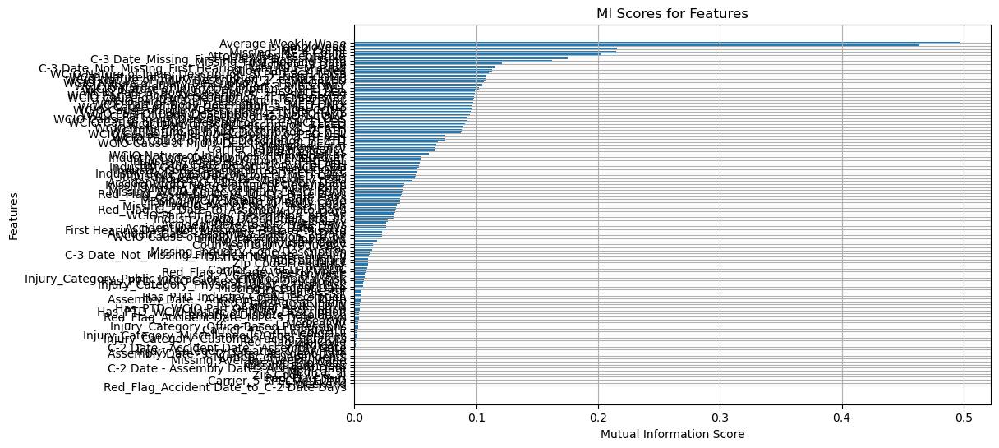

Testing 1 features with RFE...
Testing 4 features with RFE...
Testing 7 features with RFE...
Testing 10 features with RFE...
Testing 13 features with RFE...
Testing 16 features with RFE...
Testing 19 features with RFE...
Testing 22 features with RFE...
Testing 25 features with RFE...
Testing 28 features with RFE...
Testing 31 features with RFE...
Testing 34 features with RFE...
Testing 37 features with RFE...
Testing 40 features with RFE...
Testing 43 features with RFE...
Testing 46 features with RFE...
Testing 49 features with RFE...
Testing 52 features with RFE...
Testing 55 features with RFE...
Testing 58 features with RFE...
Testing 61 features with RFE...
Testing 64 features with RFE...
Optimum number of features: 52
Best F1 Macro Score: 0.4395
Number of iterations performed: [78]
Features selected by Lasso (Threshold > 0.01): 55
['is_employeed', 'IME-4 Count', 'Average Weekly Wage', 'Accident Date_to_Assembly Date Days', 'Attorney/Representative', 'Missing_IME-4 Count', 'First He

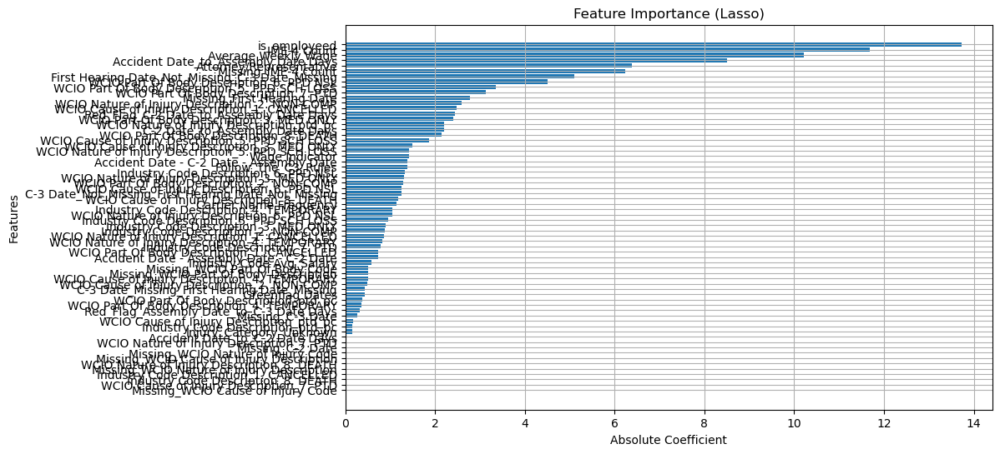

[I 2024-12-21 00:04:42,745] A new study created in memory with name: no-name-4586f5c3-8f2e-45ff-92e4-6e5109c50c93


Otimização para log...


[I 2024-12-21 00:06:44,076] Trial 0 finished with value: 0.38603787150720553 and parameters: {'C': 0.02469186766272702, 'penalty': 'none', 'solver': 'sag', 'max_iter': 842, 'multi_class': 'multinomial'}. Best is trial 0 with value: 0.38603787150720553.
[I 2024-12-21 00:07:41,854] Trial 1 finished with value: 0.3656005163227003 and parameters: {'C': 12.568895872000526, 'penalty': 'none', 'solver': 'lbfgs', 'max_iter': 893, 'multi_class': 'ovr'}. Best is trial 0 with value: 0.38603787150720553.
[I 2024-12-21 00:10:34,697] Trial 2 finished with value: 0.3561799690394554 and parameters: {'C': 16.224092012529763, 'penalty': 'l2', 'solver': 'sag', 'max_iter': 601, 'multi_class': 'ovr'}. Best is trial 0 with value: 0.38603787150720553.
[I 2024-12-21 00:11:00,246] Trial 3 finished with value: 0.3838967088757983 and parameters: {'C': 0.1897056757058219, 'penalty': 'none', 'solver': 'lbfgs', 'max_iter': 756, 'multi_class': 'multinomial'}. Best is trial 0 with value: 0.38603787150720553.
[I 2024-

Otimização para mlp...


[I 2024-12-21 00:36:07,894] Trial 0 finished with value: 0.27832953867535404 and parameters: {'hidden_layer_sizes': (100, 100), 'activation': 'tanh', 'solver': 'adam', 'alpha': 0.3817095683548638, 'learning_rate': 'invscaling', 'learning_rate_init': 0.009228502960840327, 'max_iter': 710}. Best is trial 0 with value: 0.27832953867535404.
[I 2024-12-21 00:38:30,921] Trial 1 finished with value: 0.41421647411708007 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.030315691625105123, 'learning_rate': 'invscaling', 'learning_rate_init': 0.005664842782584171, 'max_iter': 465}. Best is trial 1 with value: 0.41421647411708007.
[I 2024-12-21 00:39:17,901] Trial 2 finished with value: 0.08411659737097817 and parameters: {'hidden_layer_sizes': (100, 100), 'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.12099914256517397, 'learning_rate': 'invscaling', 'learning_rate_init': 0.00012312395156276242, 'max_iter': 415}. Best is trial 1 with value:

Otimização para rf...


[I 2024-12-21 01:53:40,436] Trial 0 finished with value: 0.30125162285070334 and parameters: {'n_estimators': 207, 'max_depth': 5, 'min_samples_split': 11, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'bootstrap': False}. Best is trial 0 with value: 0.30125162285070334.
[I 2024-12-21 01:53:53,847] Trial 1 finished with value: 0.3273326785733074 and parameters: {'n_estimators': 114, 'max_depth': 7, 'min_samples_split': 4, 'min_samples_leaf': 6, 'max_features': 'log2', 'bootstrap': False}. Best is trial 1 with value: 0.3273326785733074.
[I 2024-12-21 01:54:01,416] Trial 2 finished with value: 0.22972931457112103 and parameters: {'n_estimators': 103, 'max_depth': 3, 'min_samples_split': 5, 'min_samples_leaf': 3, 'max_features': 'auto', 'bootstrap': False}. Best is trial 1 with value: 0.3273326785733074.
[I 2024-12-21 01:54:07,169] Trial 3 finished with value: 0.33165482516591394 and parameters: {'n_estimators': 50, 'max_depth': 8, 'min_samples_split': 20, 'min_samples_leaf': 11, 'max_fe

Otimização para lgbm...
[LightGBM] [Warning] lambda_l1 is set=0.00792561678244112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00792561678244112
[LightGBM] [Warning] lambda_l2 is set=3.407905771935355e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.407905771935355e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.00792561678244112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00792561678244112
[LightGBM] [Warning] lambda_l2 is set=3.407905771935355e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.407905771935355e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[Li

[I 2024-12-21 02:00:35,679] Trial 0 finished with value: 0.37711191094047813 and parameters: {'max_depth': 5, 'learning_rate': 0.017609827876874456, 'n_estimators': 61, 'num_leaves': 117, 'min_child_samples': 68, 'subsample': 0.5426195716506106, 'colsample_bytree': 0.5832881346749443, 'lambda_l1': 0.00792561678244112, 'lambda_l2': 3.407905771935355e-05, 'scale_pos_weight': 9.766002560886278}. Best is trial 0 with value: 0.37711191094047813.


[LightGBM] [Warning] lambda_l1 is set=0.6883370623515087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6883370623515087
[LightGBM] [Warning] lambda_l2 is set=6.551828959815342e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.551828959815342e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.6883370623515087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6883370623515087
[LightGBM] [Warning] lambda_l2 is set=6.551828959815342e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.551828959815342e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start trainin

[I 2024-12-21 02:00:46,163] Trial 1 finished with value: 0.388806360576588 and parameters: {'max_depth': 7, 'learning_rate': 0.22137579465103852, 'n_estimators': 126, 'num_leaves': 184, 'min_child_samples': 68, 'subsample': 0.7858622343164624, 'colsample_bytree': 0.6882127037137971, 'lambda_l1': 0.6883370623515087, 'lambda_l2': 6.551828959815342e-05, 'scale_pos_weight': 4.607584778429333}. Best is trial 1 with value: 0.388806360576588.


[LightGBM] [Warning] lambda_l1 is set=0.0001916561081811559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001916561081811559
[LightGBM] [Warning] lambda_l2 is set=8.601278757890902e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.601278757890902e-07
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.0001916561081811559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001916561081811559
[LightGBM] [Warning] lambda_l2 is set=8.601278757890902e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.601278757890902e-07
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] S

[I 2024-12-21 02:01:16,853] Trial 2 finished with value: 0.4239282007705612 and parameters: {'max_depth': 9, 'learning_rate': 0.015012631455454962, 'n_estimators': 276, 'num_leaves': 171, 'min_child_samples': 10, 'subsample': 0.6036593427126721, 'colsample_bytree': 0.5275135427333557, 'lambda_l1': 0.0001916561081811559, 'lambda_l2': 8.601278757890902e-07, 'scale_pos_weight': 6.518288331956303}. Best is trial 2 with value: 0.4239282007705612.


[LightGBM] [Warning] lambda_l1 is set=4.6469739928298917e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6469739928298917e-07
[LightGBM] [Warning] lambda_l2 is set=0.0033271906078038713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0033271906078038713
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=4.6469739928298917e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6469739928298917e-07
[LightGBM] [Warning] lambda_l2 is set=0.0033271906078038713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0033271906078038713
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Inf

[I 2024-12-21 02:01:30,129] Trial 3 finished with value: 0.43242073354827726 and parameters: {'max_depth': 8, 'learning_rate': 0.05292143367434009, 'n_estimators': 152, 'num_leaves': 187, 'min_child_samples': 95, 'subsample': 0.748339444730018, 'colsample_bytree': 0.9159045918545596, 'lambda_l1': 4.6469739928298917e-07, 'lambda_l2': 0.0033271906078038713, 'scale_pos_weight': 2.684119233965892}. Best is trial 3 with value: 0.43242073354827726.


[LightGBM] [Warning] lambda_l1 is set=0.09706941177200903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09706941177200903
[LightGBM] [Warning] lambda_l2 is set=1.1561598487522917e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1561598487522917e-08
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.09706941177200903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09706941177200903
[LightGBM] [Warning] lambda_l2 is set=1.1561598487522917e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1561598487522917e-08
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start

[I 2024-12-21 02:01:39,808] Trial 4 finished with value: 0.39900005307982506 and parameters: {'max_depth': 3, 'learning_rate': 0.01696805131146694, 'n_estimators': 239, 'num_leaves': 182, 'min_child_samples': 47, 'subsample': 0.6017364307265101, 'colsample_bytree': 0.7656377896342701, 'lambda_l1': 0.09706941177200903, 'lambda_l2': 1.1561598487522917e-08, 'scale_pos_weight': 1.841909081068442}. Best is trial 3 with value: 0.43242073354827726.


[LightGBM] [Warning] lambda_l1 is set=0.44163752336502743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44163752336502743
[LightGBM] [Warning] lambda_l2 is set=0.009558167683548639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009558167683548639
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.44163752336502743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44163752336502743
[LightGBM] [Warning] lambda_l2 is set=0.009558167683548639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009558167683548639
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start trainin

[I 2024-12-21 02:01:56,746] Trial 5 finished with value: 0.4331335330884043 and parameters: {'max_depth': 8, 'learning_rate': 0.033869282031313064, 'n_estimators': 266, 'num_leaves': 37, 'min_child_samples': 71, 'subsample': 0.9153561692202262, 'colsample_bytree': 0.7145203276972363, 'lambda_l1': 0.44163752336502743, 'lambda_l2': 0.009558167683548639, 'scale_pos_weight': 2.7028802159440564}. Best is trial 5 with value: 0.4331335330884043.


[LightGBM] [Warning] lambda_l1 is set=1.7113607810366191e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7113607810366191e-06
[LightGBM] [Warning] lambda_l2 is set=2.6197747690947787e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6197747690947787e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=1.7113607810366191e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7113607810366191e-06
[LightGBM] [Warning] lambda_l2 is set=2.6197747690947787e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6197747690947787e-05
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] 

[I 2024-12-21 02:02:07,332] Trial 6 finished with value: 0.35847461605014197 and parameters: {'max_depth': 8, 'learning_rate': 0.19834310843420583, 'n_estimators': 134, 'num_leaves': 68, 'min_child_samples': 24, 'subsample': 0.9876135181897197, 'colsample_bytree': 0.6546820751682261, 'lambda_l1': 1.7113607810366191e-06, 'lambda_l2': 2.6197747690947787e-05, 'scale_pos_weight': 2.255815341367984}. Best is trial 5 with value: 0.4331335330884043.


[LightGBM] [Warning] lambda_l1 is set=0.10919779947098766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10919779947098766
[LightGBM] [Warning] lambda_l2 is set=0.00029041890877675033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00029041890877675033
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.10919779947098766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10919779947098766
[LightGBM] [Warning] lambda_l2 is set=0.00029041890877675033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00029041890877675033
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start

[I 2024-12-21 02:02:22,754] Trial 7 finished with value: 0.3892436521944316 and parameters: {'max_depth': 9, 'learning_rate': 0.10772307628721292, 'n_estimators': 175, 'num_leaves': 79, 'min_child_samples': 12, 'subsample': 0.5008138118482084, 'colsample_bytree': 0.8511083364045829, 'lambda_l1': 0.10919779947098766, 'lambda_l2': 0.00029041890877675033, 'scale_pos_weight': 5.75070653634972}. Best is trial 5 with value: 0.4331335330884043.


[LightGBM] [Warning] lambda_l1 is set=1.3400259324279974e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3400259324279974e-08
[LightGBM] [Warning] lambda_l2 is set=9.89583992028603e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.89583992028603e-07
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=1.3400259324279974e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3400259324279974e-08
[LightGBM] [Warning] lambda_l2 is set=9.89583992028603e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.89583992028603e-07
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] S

[I 2024-12-21 02:02:30,871] Trial 8 finished with value: 0.3845263042916135 and parameters: {'max_depth': 6, 'learning_rate': 0.18229390283257138, 'n_estimators': 111, 'num_leaves': 39, 'min_child_samples': 93, 'subsample': 0.9429630022337359, 'colsample_bytree': 0.9732271435131763, 'lambda_l1': 1.3400259324279974e-08, 'lambda_l2': 9.89583992028603e-07, 'scale_pos_weight': 7.14723057179257}. Best is trial 5 with value: 0.4331335330884043.


[LightGBM] [Warning] lambda_l1 is set=2.2973397705503263e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2973397705503263e-06
[LightGBM] [Warning] lambda_l2 is set=3.77644278664796e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.77644278664796e-08
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=2.2973397705503263e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2973397705503263e-06
[LightGBM] [Warning] lambda_l2 is set=3.77644278664796e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.77644278664796e-08
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012212 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] S

[I 2024-12-21 02:02:40,537] Trial 9 finished with value: 0.3888054264797277 and parameters: {'max_depth': 6, 'learning_rate': 0.16471837161884154, 'n_estimators': 134, 'num_leaves': 180, 'min_child_samples': 97, 'subsample': 0.5155688635998585, 'colsample_bytree': 0.793326636710701, 'lambda_l1': 2.2973397705503263e-06, 'lambda_l2': 3.77644278664796e-08, 'scale_pos_weight': 3.5751120724344227}. Best is trial 5 with value: 0.4331335330884043.


[LightGBM] [Warning] lambda_l1 is set=0.0007676034698501388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007676034698501388
[LightGBM] [Warning] lambda_l2 is set=0.09616688635734252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09616688635734252
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.0007676034698501388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007676034698501388
[LightGBM] [Warning] lambda_l2 is set=0.09616688635734252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09616688635734252
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012505 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start tra

[I 2024-12-21 02:03:01,502] Trial 10 finished with value: 0.4300501642823408 and parameters: {'max_depth': 10, 'learning_rate': 0.04085593128878672, 'n_estimators': 234, 'num_leaves': 121, 'min_child_samples': 46, 'subsample': 0.8735072008813874, 'colsample_bytree': 0.6591013041895871, 'lambda_l1': 0.0007676034698501388, 'lambda_l2': 0.09616688635734252, 'scale_pos_weight': 1.3430875448487196}. Best is trial 5 with value: 0.4331335330884043.


[LightGBM] [Warning] lambda_l1 is set=2.369693448905718e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.369693448905718e-06
[LightGBM] [Warning] lambda_l2 is set=0.03704982321936288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03704982321936288
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=2.369693448905718e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.369693448905718e-06
[LightGBM] [Warning] lambda_l2 is set=0.03704982321936288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03704982321936288
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012688 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start tra

[I 2024-12-21 02:03:27,787] Trial 11 finished with value: 0.43066630736158795 and parameters: {'max_depth': 8, 'learning_rate': 0.04325338307485271, 'n_estimators': 298, 'num_leaves': 253, 'min_child_samples': 79, 'subsample': 0.7260012957421078, 'colsample_bytree': 0.9287065651020481, 'lambda_l1': 2.369693448905718e-06, 'lambda_l2': 0.03704982321936288, 'scale_pos_weight': 3.50766472030492}. Best is trial 5 with value: 0.4331335330884043.


[LightGBM] [Warning] lambda_l1 is set=1.1175342374833386e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1175342374833386e-08
[LightGBM] [Warning] lambda_l2 is set=0.003538192660403149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003538192660403149
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=1.1175342374833386e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1175342374833386e-08
[LightGBM] [Warning] lambda_l2 is set=0.003538192660403149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003538192660403149
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012387 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] S

[I 2024-12-21 02:03:44,472] Trial 12 finished with value: 0.4231371312038977 and parameters: {'max_depth': 8, 'learning_rate': 0.06177680224676939, 'n_estimators': 190, 'num_leaves': 228, 'min_child_samples': 80, 'subsample': 0.7604200311645941, 'colsample_bytree': 0.8727704725319557, 'lambda_l1': 1.1175342374833386e-08, 'lambda_l2': 0.003538192660403149, 'scale_pos_weight': 3.337445584285144}. Best is trial 5 with value: 0.4331335330884043.


[LightGBM] [Warning] lambda_l1 is set=2.2753423541175088e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2753423541175088e-07
[LightGBM] [Warning] lambda_l2 is set=0.6085050574818516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6085050574818516
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=2.2753423541175088e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2753423541175088e-07
[LightGBM] [Warning] lambda_l2 is set=0.6085050574818516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6085050574818516
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012117 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start tra

[I 2024-12-21 02:04:03,340] Trial 13 finished with value: 0.43454394129675505 and parameters: {'max_depth': 10, 'learning_rate': 0.02793476084314409, 'n_estimators': 193, 'num_leaves': 215, 'min_child_samples': 85, 'subsample': 0.8503982783851536, 'colsample_bytree': 0.7269197082655868, 'lambda_l1': 2.2753423541175088e-07, 'lambda_l2': 0.6085050574818516, 'scale_pos_weight': 1.0759293449572964}. Best is trial 13 with value: 0.43454394129675505.


[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is set=0.43818459039598173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43818459039598173
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is set=0.43818459039598173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43818459039598173
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start tra

[I 2024-12-21 02:04:26,573] Trial 14 finished with value: 0.4362237227847561 and parameters: {'max_depth': 10, 'learning_rate': 0.02725365007652007, 'n_estimators': 228, 'num_leaves': 220, 'min_child_samples': 61, 'subsample': 0.8571856635685757, 'colsample_bytree': 0.7232263537563192, 'lambda_l1': 3.147988666441465e-05, 'lambda_l2': 0.43818459039598173, 'scale_pos_weight': 1.0667111210353124}. Best is trial 14 with value: 0.4362237227847561.


[LightGBM] [Warning] lambda_l1 is set=2.1578592058030893e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1578592058030893e-05
[LightGBM] [Warning] lambda_l2 is set=0.849477443581194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.849477443581194
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=2.1578592058030893e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1578592058030893e-05
[LightGBM] [Warning] lambda_l2 is set=0.849477443581194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.849477443581194
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start trainin

[I 2024-12-21 02:04:49,401] Trial 15 finished with value: 0.4360420286919949 and parameters: {'max_depth': 10, 'learning_rate': 0.029456339514043948, 'n_estimators': 223, 'num_leaves': 221, 'min_child_samples': 55, 'subsample': 0.8585388836754011, 'colsample_bytree': 0.8027540229472995, 'lambda_l1': 2.1578592058030893e-05, 'lambda_l2': 0.849477443581194, 'scale_pos_weight': 1.197420681298502}. Best is trial 14 with value: 0.4362237227847561.


[LightGBM] [Warning] lambda_l1 is set=3.2739139585393685e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2739139585393685e-05
[LightGBM] [Warning] lambda_l2 is set=0.8845661158974574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8845661158974574
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=3.2739139585393685e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2739139585393685e-05
[LightGBM] [Warning] lambda_l2 is set=0.8845661158974574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8845661158974574
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013008 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start tra

[I 2024-12-21 02:05:12,008] Trial 16 finished with value: 0.4361919490943399 and parameters: {'max_depth': 10, 'learning_rate': 0.024477452157034545, 'n_estimators': 218, 'num_leaves': 250, 'min_child_samples': 54, 'subsample': 0.8436335857470632, 'colsample_bytree': 0.8086892706295145, 'lambda_l1': 3.2739139585393685e-05, 'lambda_l2': 0.8845661158974574, 'scale_pos_weight': 9.046758524788142}. Best is trial 14 with value: 0.4362237227847561.


[LightGBM] [Warning] lambda_l1 is set=3.9303300292865355e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9303300292865355e-05
[LightGBM] [Warning] lambda_l2 is set=0.09938842753818668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09938842753818668
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=3.9303300292865355e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9303300292865355e-05
[LightGBM] [Warning] lambda_l2 is set=0.09938842753818668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09938842753818668
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start

[I 2024-12-21 02:05:21,961] Trial 17 finished with value: 0.39895897782339185 and parameters: {'max_depth': 4, 'learning_rate': 0.01118060993695193, 'n_estimators': 212, 'num_leaves': 253, 'min_child_samples': 33, 'subsample': 0.6901908758975229, 'colsample_bytree': 0.5954647327929765, 'lambda_l1': 3.9303300292865355e-05, 'lambda_l2': 0.09938842753818668, 'scale_pos_weight': 8.88233468562873}. Best is trial 14 with value: 0.4362237227847561.


[LightGBM] [Warning] lambda_l1 is set=0.0018953619259421068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018953619259421068
[LightGBM] [Warning] lambda_l2 is set=0.0010037581871029982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010037581871029982
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=0.0018953619259421068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018953619259421068
[LightGBM] [Warning] lambda_l2 is set=0.0010037581871029982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010037581871029982
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] S

[I 2024-12-21 02:05:47,525] Trial 18 finished with value: 0.35186516611749763 and parameters: {'max_depth': 9, 'learning_rate': 0.07777696151746707, 'n_estimators': 246, 'num_leaves': 151, 'min_child_samples': 56, 'subsample': 0.806938658030776, 'colsample_bytree': 0.8268704137650043, 'lambda_l1': 0.0018953619259421068, 'lambda_l2': 0.0010037581871029982, 'scale_pos_weight': 7.7849456089500695}. Best is trial 14 with value: 0.4362237227847561.


[LightGBM] [Warning] lambda_l1 is set=1.2660808695768863e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2660808695768863e-05
[LightGBM] [Warning] lambda_l2 is set=0.19368997126138218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19368997126138218
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=1.2660808695768863e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2660808695768863e-05
[LightGBM] [Warning] lambda_l2 is set=0.19368997126138218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19368997126138218
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2275
[LightGBM] [Info] Number of data points in the train set: 91844, number of used features: 46
[LightGBM] [Info] Start training from score -3.828946
[LightGBM] [Info] Start

[I 2024-12-21 02:06:04,829] Trial 19 finished with value: 0.4320935293650209 and parameters: {'max_depth': 10, 'learning_rate': 0.022342326361813904, 'n_estimators': 165, 'num_leaves': 210, 'min_child_samples': 37, 'subsample': 0.998631802420351, 'colsample_bytree': 0.754592134257427, 'lambda_l1': 1.2660808695768863e-05, 'lambda_l2': 0.19368997126138218, 'scale_pos_weight': 4.743324984264815}. Best is trial 14 with value: 0.4362237227847561.
[I 2024-12-21 02:06:04,830] A new study created in memory with name: no-name-57a6de92-4eb2-4a16-8e50-03e737f1cc76


Otimização para xgb...


[I 2024-12-21 02:06:08,180] Trial 0 finished with value: 0.43589061617586733 and parameters: {'max_depth': 7, 'learning_rate': 0.28243455014449087, 'n_estimators': 50, 'min_child_weight': 3, 'gamma': 0.21907990706740121, 'subsample': 0.6987856470690066, 'colsample_bytree': 0.6046040763688942, 'reg_alpha': 2.0204254681956306e-07, 'reg_lambda': 0.11915396638210397}. Best is trial 0 with value: 0.43589061617586733.
[I 2024-12-21 02:06:15,575] Trial 1 finished with value: 0.34441667535300985 and parameters: {'max_depth': 4, 'learning_rate': 0.011574889497892631, 'n_estimators': 162, 'min_child_weight': 6, 'gamma': 0.4074863382724667, 'subsample': 0.9840528983696499, 'colsample_bytree': 0.6066942164928107, 'reg_alpha': 0.4104069472916668, 'reg_lambda': 0.2837734185318931}. Best is trial 0 with value: 0.43589061617586733.
[I 2024-12-21 02:06:19,322] Trial 2 finished with value: 0.3950636532993087 and parameters: {'max_depth': 6, 'learning_rate': 0.012997773384849977, 'n_estimators': 66, 'min

Training model: Logistic Regression
Logistic Regression - Accuracy: 0.7667, F1 Macro: 0.3888, F1 Weighted: 0.7193, Precision: 0.7170, Recall: 0.7667
Training model: Random Forest
Random Forest - Accuracy: 0.7757, F1 Macro: 0.3501, F1 Weighted: 0.7224, Precision: 0.7550, Recall: 0.7757
Training model: XGBoost
XGBoost - Accuracy: 0.7889, F1 Macro: 0.4497, F1 Weighted: 0.7472, Precision: 0.7606, Recall: 0.7889
Training model: LightGBM
[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is set=0.43818459039598173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43818459039598173
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is set=0.43818459039598173, reg_lambda=

[I 2024-12-21 03:18:44,603] A new study created in memory with name: no-name-58f1e3f9-f9d5-41ea-9a44-6137637057c9
[I 2024-12-21 03:18:44,664] Trial 0 finished with value: 0.42214765646343766 and parameters: {'weight_rf': 9, 'weight_xgb': 4, 'weight_lgbm': 10, 'weight_log_reg': 2, 'weight_mlp': 6}. Best is trial 0 with value: 0.42214765646343766.
[I 2024-12-21 03:18:44,727] Trial 1 finished with value: 0.4151337950005677 and parameters: {'weight_rf': 7, 'weight_xgb': 4, 'weight_lgbm': 3, 'weight_log_reg': 4, 'weight_mlp': 3}. Best is trial 0 with value: 0.42214765646343766.
[I 2024-12-21 03:18:44,786] Trial 2 finished with value: 0.4195443688878983 and parameters: {'weight_rf': 0, 'weight_xgb': 4, 'weight_lgbm': 2, 'weight_log_reg': 8, 'weight_mlp': 2}. Best is trial 0 with value: 0.42214765646343766.
[I 2024-12-21 03:18:44,846] Trial 3 finished with value: 0.4302730660701273 and parameters: {'weight_rf': 2, 'weight_xgb': 6, 'weight_lgbm': 3, 'weight_log_reg': 4, 'weight_mlp': 3}. Best 

Best Weights Found: {'weight_rf': 0, 'weight_xgb': 4, 'weight_lgbm': 1, 'weight_log_reg': 0, 'weight_mlp': 0}
Validation F1 Macro: 0.4514
Validation Accuracy: 0.7894
[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is set=0.43818459039598173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43818459039598173
[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is set=0.43818459039598173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43818459039598173


[I 2024-12-21 03:21:00,318] A new study created in memory with name: no-name-c5ecad99-2f19-49a7-8092-bb57876431d3
[I 2024-12-21 03:21:00,379] Trial 0 finished with value: 0.4319129926312784 and parameters: {'weight_rf': 2, 'weight_xgb': 4, 'weight_lgbm': 6, 'weight_log_reg': 8, 'weight_mlp': 0}. Best is trial 0 with value: 0.4319129926312784.
[I 2024-12-21 03:21:00,440] Trial 1 finished with value: 0.4218868108324809 and parameters: {'weight_rf': 3, 'weight_xgb': 0, 'weight_lgbm': 6, 'weight_log_reg': 10, 'weight_mlp': 4}. Best is trial 0 with value: 0.4319129926312784.
[I 2024-12-21 03:21:00,499] Trial 2 finished with value: 0.412298954207833 and parameters: {'weight_rf': 8, 'weight_xgb': 1, 'weight_lgbm': 2, 'weight_log_reg': 2, 'weight_mlp': 7}. Best is trial 0 with value: 0.4319129926312784.
[I 2024-12-21 03:21:00,558] Trial 3 finished with value: 0.41747661161115107 and parameters: {'weight_rf': 10, 'weight_xgb': 2, 'weight_lgbm': 6, 'weight_log_reg': 5, 'weight_mlp': 0}. Best is 

Best Weights Found: {'weight_rf': 0, 'weight_xgb': 7, 'weight_lgbm': 1, 'weight_log_reg': 0, 'weight_mlp': 1}
Validation F1 Macro: 0.4627
Validation Accuracy: 0.8042
[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is set=0.43818459039598173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43818459039598173


[I 2024-12-21 03:23:10,799] A new study created in memory with name: no-name-112ca623-e4ee-4c53-ac8c-f61b36daeeb4


Original class distribution: Counter({1: 232862, 3: 118805, 2: 55125, 4: 38624, 0: 9981, 5: 3369, 7: 376, 6: 78})


[I 2024-12-21 03:24:46,160] Trial 0 finished with value: 0.4709887595638165 and parameters: {'smote_increase_class_0': 6720, 'smote_increase_class_2': 46058, 'smote_increase_class_5': 2606, 'smote_increase_class_6': 307, 'smote_increase_class_7': 729, 'undersample_factor_class_3': 0.5899121023891447, 'undersample_factor_class_1': 0.6636128835425167}. Best is trial 0 with value: 0.4709887595638165.
[I 2024-12-21 03:26:12,827] Trial 1 finished with value: 0.4698495880328881 and parameters: {'smote_increase_class_0': 12394, 'smote_increase_class_2': 58039, 'smote_increase_class_5': 1564, 'smote_increase_class_6': 551, 'smote_increase_class_7': 1214, 'undersample_factor_class_3': 0.5932667163503555, 'undersample_factor_class_1': 0.462525261200837}. Best is trial 0 with value: 0.4709887595638165.
[I 2024-12-21 03:27:36,817] Trial 2 finished with value: 0.4674661253027247 and parameters: {'smote_increase_class_0': 11467, 'smote_increase_class_2': 9245, 'smote_increase_class_5': 4812, 'smote_

Best parameters: {'smote_increase_class_0': 5615, 'smote_increase_class_2': 63398, 'smote_increase_class_5': 3752, 'smote_increase_class_6': 719, 'smote_increase_class_7': 1046, 'undersample_factor_class_3': 0.5495585284893231, 'undersample_factor_class_1': 0.34785442687727636}


[I 2024-12-21 04:06:40,870] A new study created in memory with name: no-name-7653c64d-ddfd-49d7-8608-2b998c2b6927


Final class distribution: Counter({2: 118523, 1: 81002, 3: 65290, 4: 38624, 0: 15596, 5: 7121, 7: 1422, 6: 797})
Original class distribution: Counter({1: 232862, 3: 118805, 2: 55125, 4: 38624, 0: 9981, 5: 3369, 7: 376, 6: 78})


[I 2024-12-21 04:07:53,495] Trial 0 finished with value: 0.484489756235516 and parameters: {'smote_increase_class_0': 5783, 'smote_increase_class_2': 3816, 'smote_increase_class_5': 396, 'smote_increase_class_6': 147, 'smote_increase_class_7': 442, 'undersample_factor_class_3': 0.5485820489070248, 'undersample_factor_class_1': 0.5555037532907774}. Best is trial 0 with value: 0.484489756235516.
[I 2024-12-21 04:09:11,248] Trial 1 finished with value: 0.49606624147123884 and parameters: {'smote_increase_class_0': 5361, 'smote_increase_class_2': 23283, 'smote_increase_class_5': 1782, 'smote_increase_class_6': 326, 'smote_increase_class_7': 1074, 'undersample_factor_class_3': 0.323299607916619, 'undersample_factor_class_1': 0.5208934760497314}. Best is trial 1 with value: 0.49606624147123884.
[I 2024-12-21 04:10:43,537] Trial 2 finished with value: 0.4885441956025446 and parameters: {'smote_increase_class_0': 18287, 'smote_increase_class_2': 89188, 'smote_increase_class_5': 9753, 'smote_in

Best parameters: {'smote_increase_class_0': 5361, 'smote_increase_class_2': 23283, 'smote_increase_class_5': 1782, 'smote_increase_class_6': 326, 'smote_increase_class_7': 1074, 'undersample_factor_class_3': 0.323299607916619, 'undersample_factor_class_1': 0.5208934760497314}
Final class distribution: Counter({1: 121296, 2: 78408, 4: 38624, 3: 38409, 0: 15342, 5: 5151, 7: 1450, 6: 404})
Training model: Logistic Regression
Logistic Regression - Accuracy: 0.6348, F1 Macro: 0.4234, F1 Weighted: 0.6673, Precision: 0.7323, Recall: 0.6348
Training model: Random Forest
Random Forest - Accuracy: 0.7324, F1 Macro: 0.4389, F1 Weighted: 0.7318, Precision: 0.7333, Recall: 0.7324
Training model: XGBoost
XGBoost - Accuracy: 0.7630, F1 Macro: 0.4826, F1 Weighted: 0.7524, Precision: 0.7477, Recall: 0.7630
Training model: LightGBM
[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is s

[I 2024-12-21 05:35:02,592] A new study created in memory with name: no-name-de961068-cb26-4a06-a0ee-c63451305b60
[I 2024-12-21 05:35:02,656] Trial 0 finished with value: 0.45270327498397345 and parameters: {'weight_rf': 2, 'weight_xgb': 7, 'weight_lgbm': 4, 'weight_log_reg': 5, 'weight_mlp': 9}. Best is trial 0 with value: 0.45270327498397345.
[I 2024-12-21 05:35:02,715] Trial 1 finished with value: 0.43338348537916904 and parameters: {'weight_rf': 6, 'weight_xgb': 4, 'weight_lgbm': 0, 'weight_log_reg': 9, 'weight_mlp': 9}. Best is trial 0 with value: 0.45270327498397345.
[I 2024-12-21 05:35:02,776] Trial 2 finished with value: 0.4570877474346253 and parameters: {'weight_rf': 2, 'weight_xgb': 6, 'weight_lgbm': 7, 'weight_log_reg': 5, 'weight_mlp': 6}. Best is trial 2 with value: 0.4570877474346253.
[I 2024-12-21 05:35:02,834] Trial 3 finished with value: 0.47258935100445415 and parameters: {'weight_rf': 0, 'weight_xgb': 8, 'weight_lgbm': 0, 'weight_log_reg': 0, 'weight_mlp': 0}. Best 

Best Weights Found: {'weight_rf': 0, 'weight_xgb': 8, 'weight_lgbm': 0, 'weight_log_reg': 0, 'weight_mlp': 0}
Validation F1 Macro: 0.4826
Validation Accuracy: 0.7630
[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is set=0.43818459039598173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43818459039598173
[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is set=0.43818459039598173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43818459039598173


[I 2024-12-21 05:37:12,876] A new study created in memory with name: no-name-79eefb14-79bf-4dac-a3a4-c583f651da7e
[I 2024-12-21 05:37:12,937] Trial 0 finished with value: 0.4639602299079921 and parameters: {'weight_rf': 10, 'weight_xgb': 3, 'weight_lgbm': 9, 'weight_log_reg': 9, 'weight_mlp': 1}. Best is trial 0 with value: 0.4639602299079921.
[I 2024-12-21 05:37:12,996] Trial 1 finished with value: 0.4676618732758259 and parameters: {'weight_rf': 5, 'weight_xgb': 10, 'weight_lgbm': 3, 'weight_log_reg': 8, 'weight_mlp': 9}. Best is trial 1 with value: 0.4676618732758259.
[I 2024-12-21 05:37:13,056] Trial 2 finished with value: 0.4705980610399165 and parameters: {'weight_rf': 0, 'weight_xgb': 10, 'weight_lgbm': 0, 'weight_log_reg': 6, 'weight_mlp': 4}. Best is trial 2 with value: 0.4705980610399165.
[I 2024-12-21 05:37:13,114] Trial 3 finished with value: 0.4672248627798036 and parameters: {'weight_rf': 6, 'weight_xgb': 10, 'weight_lgbm': 1, 'weight_log_reg': 0, 'weight_mlp': 5}. Best i

Best Weights Found: {'weight_rf': 0, 'weight_xgb': 8, 'weight_lgbm': 5, 'weight_log_reg': 0, 'weight_mlp': 0}
Validation F1 Macro: 0.4991
Validation Accuracy: 0.7742
[LightGBM] [Warning] lambda_l1 is set=3.147988666441465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147988666441465e-05
[LightGBM] [Warning] lambda_l2 is set=0.43818459039598173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.43818459039598173


In [449]:
X_train, X_test, y_train, y_test, best_params, selected_features_rfe, selected_features_lasso, final_selected_features, results_df,f1_per_class_df, ensemble,\
    ensemble_kaggle, trained_models,final_X, final_y, results_df_rs, f1_per_class_df_rs, ensemble_rs, ensemble_kaggle_rs, trained_models_rs, test, y_pred_test, final_weights,\
    y_pred_kaggle, y_pred_test_rs, final_weights_rs, y_pred_kaggle_rs, kaggle, kaggle_rs, f1, f1_rs, \
    X_train_with_ar, X_test_with_ar, results_df_with_ar,f1_per_class_df_with_ar, ensemble_with_ar,ensemble_kaggle_with_ar, trained_models_with_ar,final_X_with_ar, final_y_with_ar, results_df_rs_with_ar, f1_per_class_df_rs_with_ar,\
    ensemble_rs_with_ar, ensemble_kaggle_rs_with_ar, trained_models_rs_with_ar, test_with_ar, y_pred_test_with_ar, final_weights_with_ar,\
    y_pred_kaggle_with_ar, y_pred_test_rs_with_ar, final_weights_rs_with_ar, y_pred_kaggle_rs_with_ar, kaggle_with_ar, kaggle_rs_with_ar, f1_with_ar, f1_rs_with_ar  = Exodia(X_train, X_test, y_train, y_test, test_temp,ar)

In [489]:
print("=== Classification Report Of non_resampled data WITHOUT Agreement Reached === \n")
print(classification_report(y_test, y_pred_test, digits= 3))

=== Classification Report Of non_resampled data WITHOUT Agreement Reached === 

              precision    recall  f1-score   support

           0      0.737     0.525     0.613      2496
           1      0.854     0.968     0.907     58216
           2      0.539     0.080     0.139     13781
           3      0.712     0.882     0.788     29702
           4      0.694     0.583     0.634      9656
           5      0.667     0.002     0.005       842
           6      0.000     0.000     0.000        19
           7      0.661     0.436     0.526        94

    accuracy                          0.789    114806
   macro avg      0.608     0.435     0.451    114806
weighted avg      0.762     0.789     0.748    114806



In [490]:
print("=== Classification Report Of resampled data WITHOUT Agreement Reached === \n")
print(classification_report(y_test, y_pred_test_rs, digits= 3))

=== Classification Report Of resampled data WITHOUT Agreement Reached === 

              precision    recall  f1-score   support

           0      0.575     0.652     0.611      2496
           1      0.881     0.899     0.890     58216
           2      0.359     0.246     0.292     13781
           3      0.751     0.774     0.762     29702
           4      0.581     0.746     0.653      9656
           5      0.216     0.010     0.018       842
           6      0.250     0.053     0.087        19
           7      0.542     0.553     0.547        94

    accuracy                          0.763    114806
   macro avg      0.519     0.492     0.483    114806
weighted avg      0.748     0.763     0.752    114806



In [491]:
print("=== Classification Report Of non_resampled data WITH Agreement Reached === \n")
print(classification_report(y_test, y_pred_test_with_ar, digits= 3))

=== Classification Report Of non_resampled data WITH Agreement Reached === 

              precision    recall  f1-score   support

           0      0.747     0.517     0.611      2496
           1      0.863     0.971     0.914     58216
           2      0.600     0.089     0.155     13781
           3      0.742     0.909     0.817     29702
           4      0.685     0.648     0.666      9656
           5      0.143     0.001     0.002       842
           6      0.000     0.000     0.000        19
           7      0.695     0.436     0.536        94

    accuracy                          0.804    114806
   macro avg      0.559     0.446     0.463    114806
weighted avg      0.777     0.804     0.763    114806



In [492]:
print("=== Classification Report Of resampled data WITH Agreement Reached === \n")
print(classification_report(y_test, y_pred_test_rs_with_ar, digits= 3))

=== Classification Report Of resampled data WITH Agreement Reached === 

              precision    recall  f1-score   support

           0      0.656     0.599     0.626      2496
           1      0.873     0.948     0.909     58216
           2      0.376     0.256     0.305     13781
           3      0.836     0.683     0.751     29702
           4      0.540     0.861     0.664      9656
           5      0.161     0.044     0.069       842
           6      0.333     0.053     0.091        19
           7      0.560     0.596     0.577        94

    accuracy                          0.774    114806
   macro avg      0.542     0.505     0.499    114806
weighted avg      0.766     0.774     0.762    114806



In [455]:
from lime.lime_tabular import LimeTabularExplainer
from sklearn.preprocessing import LabelEncoder

y_train = toggle_mapping(y_train)

def lime(X_train, y_train, best_params):
    # Encode class labels to numeric values for compatibility with XGBoost
    label_encoder = LabelEncoder()
    y_train_encoded = label_encoder.fit_transform(y_train)

    # Train a model using XGBoost
    model = XGBClassifier(**best_params['xgb'])
    model.fit(X_train, y_train_encoded)

    # Create a LIME explainer
    explainer = LimeTabularExplainer(
        training_data=X_train.values,
        feature_names=X_train.columns,
        class_names=label_encoder.classes_,  # Use the original class names
        mode='classification'
    )

    # Select a test instance
    test_instance = X_train.iloc[0].values

    # Generate explanations for all classes
    for label_idx, label_name in enumerate(label_encoder.classes_):
        print(f"Explanation for class {label_name}:")
        explanation = explainer.explain_instance(
            data_row=test_instance,
            predict_fn=model.predict_proba,
            labels=[label_idx]  # Specify the numeric class to explain
        )

        # Visualize the explanation
        explanation.show_in_notebook()

        # Extract explanation details
        feature_names, contributions = zip(*explanation.as_list(label=label_idx))

        # Custom visualization for each class
        fig, ax = plt.subplots(figsize=(10, 6))

        # Colors based on contribution sign
        colors = ['green' if c > 0 else 'red' for c in contributions]

        # Horizontal bar chart
        ax.barh(feature_names, contributions, color=colors, edgecolor='black')

        # Add value annotations to the bars
        for i, (feature, contribution) in enumerate(zip(feature_names, contributions)):
            ax.text(
                contribution, i, f"{contribution:.2f}",
                ha='left' if contribution > 0 else 'right', va='center',
                color='black', fontsize=10
            )

        # Add titles and labels
        ax.set_title(f"LIME Explanation - Feature Contributions for Class {label_name}", fontsize=16, fontweight='bold')
        ax.set_xlabel("Contribution to Prediction", fontsize=12)
        ax.set_ylabel("Features", fontsize=12)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        # Adjust layout for better appearance
        plt.tight_layout()
        plt.show()


Explanation for class 1. CANCELLED:


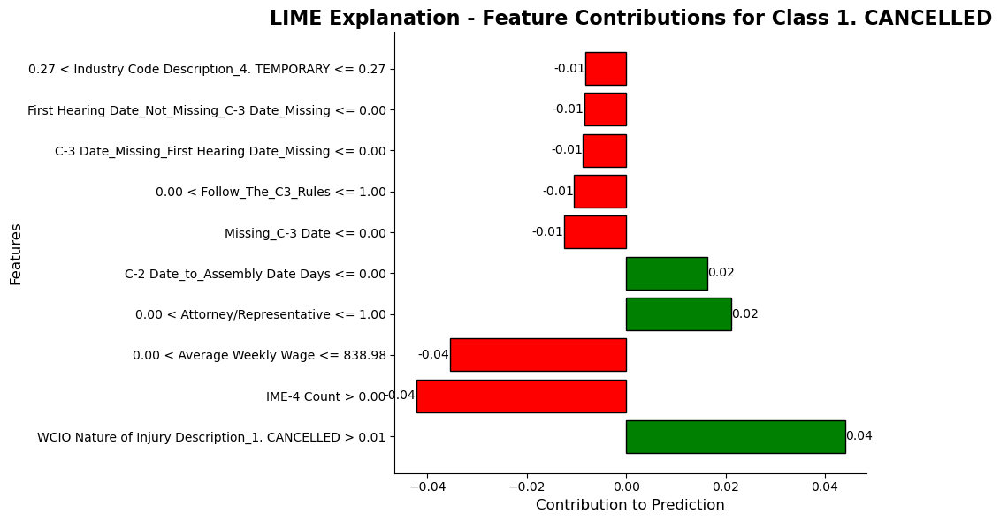

Explanation for class 2. NON-COMP:


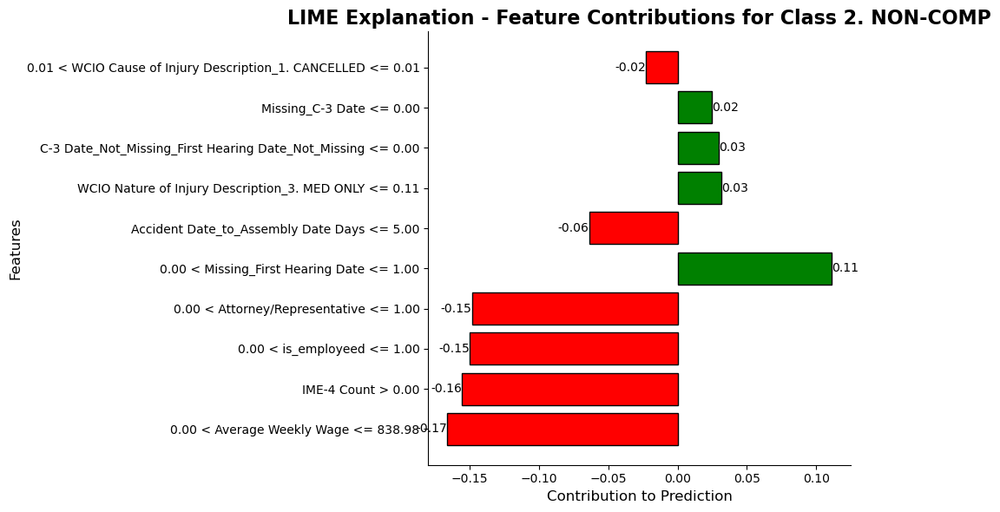

Explanation for class 3. MED ONLY:


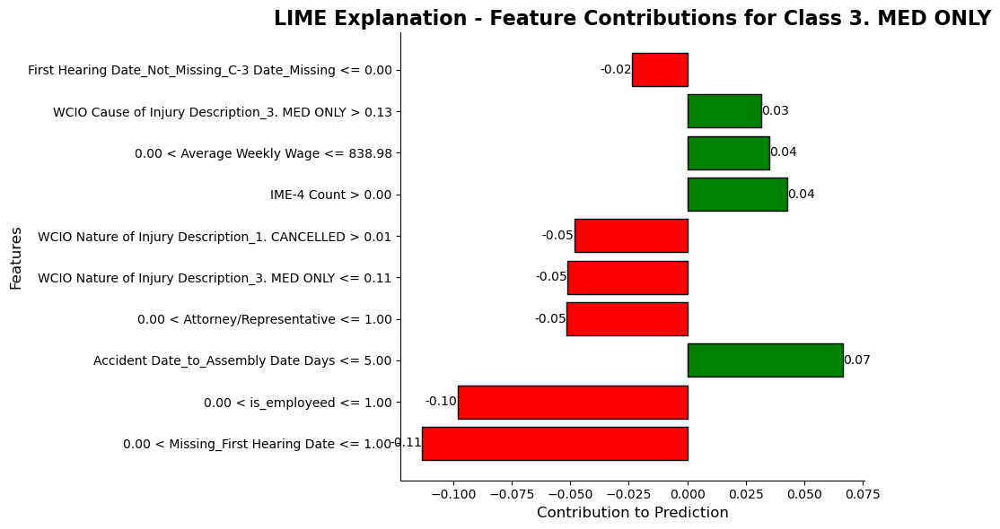

Explanation for class 4. TEMPORARY:


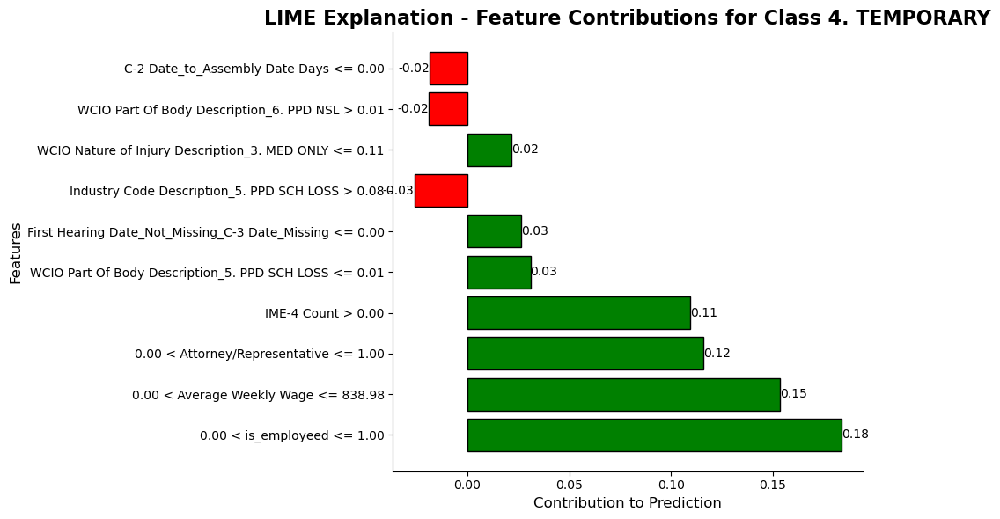

Explanation for class 5. PPD SCH LOSS:


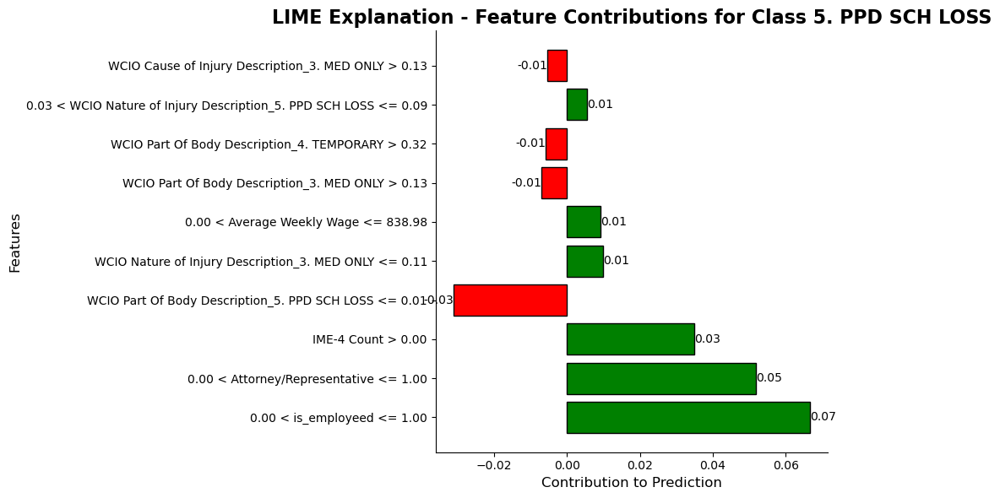

Explanation for class 6. PPD NSL:


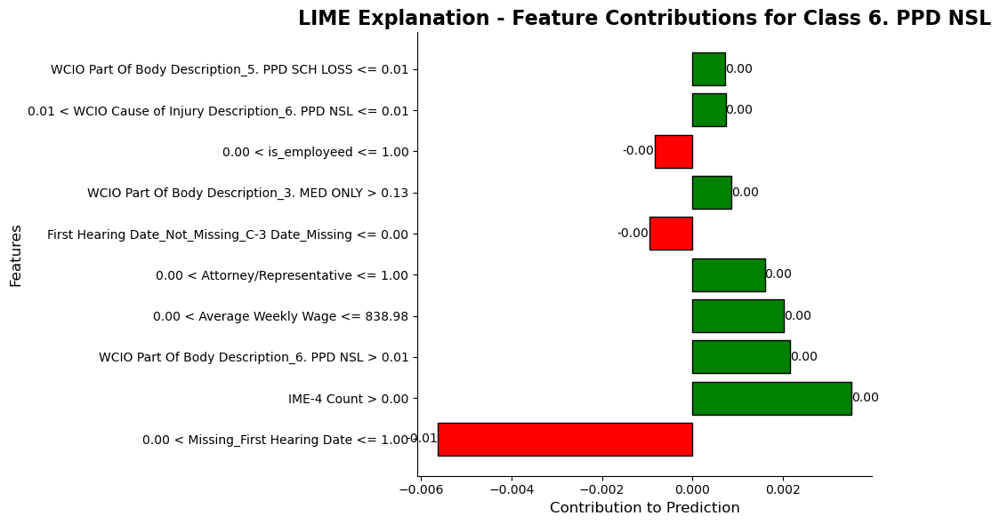

Explanation for class 7. PTD:


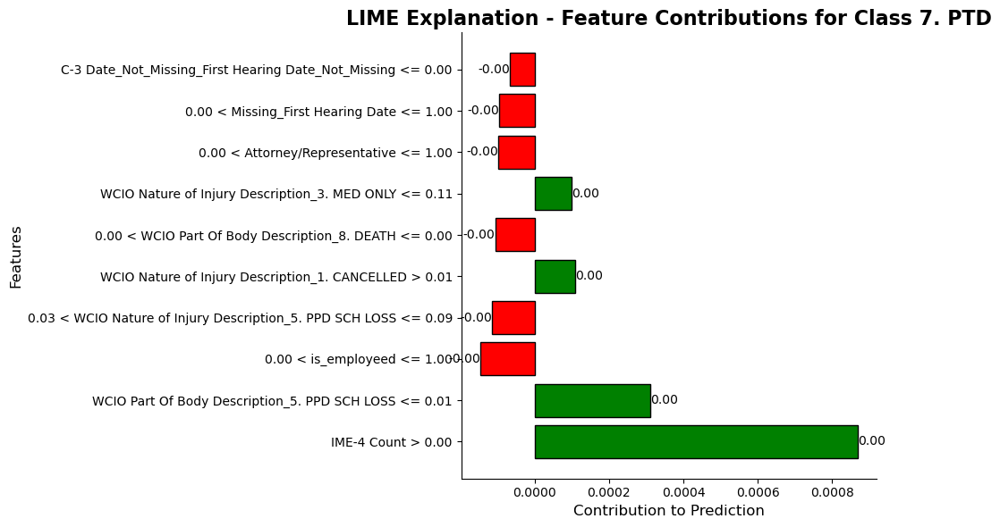

Explanation for class 8. DEATH:


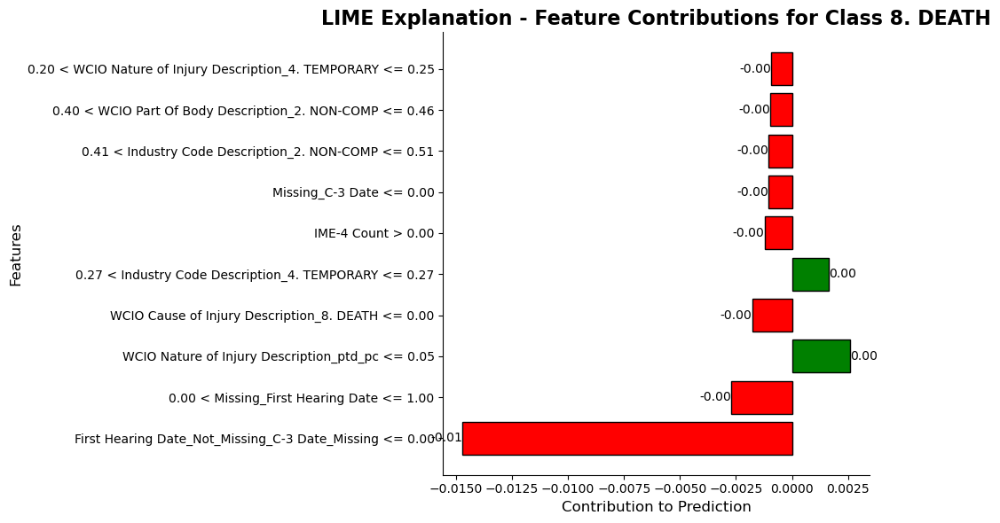

In [483]:
lime(X_train, y_train, best_params)

In [494]:
ar.to_csv("test_ar.csv", index=False)